# About COVID-19

The coronavirus (COVID-19) pandemic has spread across 190 countries infecting 1.724.736 people and killing over 390.335 so far.
In MOROCCO , as many as 1.527 COVID-19 cases have been reported  on 11 April so far. Of these, 141 have recovered and 110 have died. 
On March 14, the government of morocco annouced that the country would go under 21-day lackdown to combat the spread of the virus. 
Infections are rapidly rising in Italy, France, Germany, Spain, United Kingdom and the United States. It has has a massive impact on the global economy and stock markets
The outbreak of COVID-19 is developing into a major international crisis, and it's starting to influence important aspects of daily life. 

Corona Virus Explained in Simple Terms:
----------------------------------------------------------
    -->Let's say othmane got infected yesterday, but he won't know it untill next 14 days
    -->othmane thinks he is healthy but he is infecting 10 persons per day
    -->Now these 10 persons think they are completely healthy, they travel, go out and infect 100 others
    -->These 100 persons think they are healthy but they have already infected 1000 persons
    -->No one knows who is healthy or who can infect you
    -->All you can do is be responsible, stay in quarentine


the big questions is , if MORROCO will be able to tackle this pandemic or are we going to witness another Italy/ S.Korea/ USA?
Goal:
-----
    We need a strong model that predicts how the virus could spread across different countries and regions. The goal of this task is to build a model that predicts the spread of the virus in the next 7 days.

Tasks to be performed:
--------------------------------
    Analysing the present condition in both Marroco and india 
    Is this trend similar to Italy/S. Korea/ Wuhan.
    Exploring the world wide data
    Forecasting the world wide COVID-19 cases using Prophet
    



In [1]:
#libraries
import pandas as pd # manupilate the data

# Visualisation libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objects as go
import folium 
from folium import plugins

import folium #populate maps and geographical data 
#folium error ::: conda install -c conda-forge folium
from folium import plugins


# Part 1: Covid19 in Morocco - Data Analysis

In [2]:
#warning 12/04/2020 is my last update 
mar_data =pd.read_csv('./info/corona_morocco.csv')
data_maroc = mar_data.copy()

In [3]:
mar_data

,Date,Confirmed,Deaths,Recovered,Excluded,Beni Mellal-Khenifra,Casablanca-Settat,Draa-Tafilalet,Dakhla-Oued Ed-Dahab,Fes-Meknes,Guelmim-Oued Noun,Laayoune-Sakia El Hamra,Marrakesh-Safi,Oriental,Rabat-Sale-Kenitra,Souss-Massa,Tanger-Tetouan-Al Hoceima
0,02/03/2020,1.0,NaN,NaN,28.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,03/03/2020,NaN,NaN,NaN,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,04/03/2020,2.0,NaN,NaN,34.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,05/03/2020,NaN,NaN,NaN,40.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,06/03/2020,NaN,NaN,NaN,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,05/07/2020,14215.0,235.0,9725.0,751365.0,138.0,3161.0,585.0,8.0,1149.0,68.0,231.0,1802.0,200.0,1773.0,90.0,1693.0
126,06/07/2020,14379.0,237.0,10173.0,769260.0,162.0,3670.0,587.0,16.0,1579.0,98.0,688.0,2584.0,222.0,2012.0,93.0,2672.0
127,07/07/2020,14607.0,240.0,10639.0,786722.0,170.0,3718.0,586.0,17.0,1620.0,120.0,716.0,2605.0,233.0,2018.0,93.0,2716.0
128,08/07/2020,14771.0,242.0,11316.0,804353.0,172.0,3767.0,587.0,17.0,1642.0,126.0,729.0,2619.0,247.0,2024.0,92.0,2758.0


In [4]:
mar_data['Deaths']

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
       ...  
125    235.0
126    237.0
127    240.0
128    242.0
129    242.0
Name: Deaths, Length: 130, dtype: float64

In [120]:
mar_data

,Date,Confirmed,Deaths,Recovered,Excluded,Beni Mellal-Khenifra,Casablanca-Settat,Draa-Tafilalet,Dakhla-Oued Ed-Dahab,Fes-Meknes,Guelmim-Oued Noun,Laayoune-Sakia El Hamra,Marrakesh-Safi,Oriental,Rabat-Sale-Kenitra,Souss-Massa,Tanger-Tetouan-Al Hoceima
0,2020-03-02,1.0,0.0,0.0,28.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2020-03-03,1.0,0.0,0.0,32.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2020-03-04,2.0,0.0,0.0,34.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2020-03-05,2.0,0.0,0.0,40.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2020-03-06,2.0,0.0,0.0,50.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,2020-07-05,14215.0,235.0,9725.0,751365.0,138.0,3161.0,585.0,8.0,1149.0,68.0,231.0,1802.0,200.0,1773.0,90.0,1693.0
126,2020-07-06,14379.0,237.0,10173.0,769260.0,162.0,3670.0,587.0,16.0,1579.0,98.0,688.0,2584.0,222.0,2012.0,93.0,2672.0
127,2020-07-07,14607.0,240.0,10639.0,786722.0,170.0,3718.0,586.0,17.0,1620.0,120.0,716.0,2605.0,233.0,2018.0,93.0,2716.0
128,2020-07-08,14771.0,242.0,11316.0,804353.0,172.0,3767.0,587.0,17.0,1642.0,126.0,729.0,2619.0,247.0,2024.0,92.0,2758.0


In [6]:
mar_data["Date"] = pd.to_datetime(mar_data['Date'], dayfirst=True)
mar_data["Date"].dtype

dtype('<M8[ns]')

In [124]:
#Learn how to create interactive graphs using plotly
# import plotly.graph_objects as go
# Rise of COVID-19 cases in India
fig = go.Figure()
fig.add_trace(go.Scatter(x=mar_data['Date'], y = mar_data['Confirmed'], mode='lines+markers',name='Total Confirmed Cases'))
fig.add_trace(go.Scatter(x=mar_data['Date'], y = mar_data['Deaths'], mode='lines+markers',name='Total Deaths Cases'))
fig.add_trace(go.Scatter(x=mar_data['Date'], y = mar_data['Recovered'], mode='lines+markers',name='Total Recovered Cases'))
fig.add_trace(go.Scatter(x=mar_data['Date'], y = mar_data['Excluded'], mode='lines+markers',name='Total Excluded Cases'))
fig.update_layout(title_text='Trend of Coronavirus Cases in MOROCCO (Cumulative cases)',plot_bgcolor='rgb(230, 230, 230)')
fig.show()

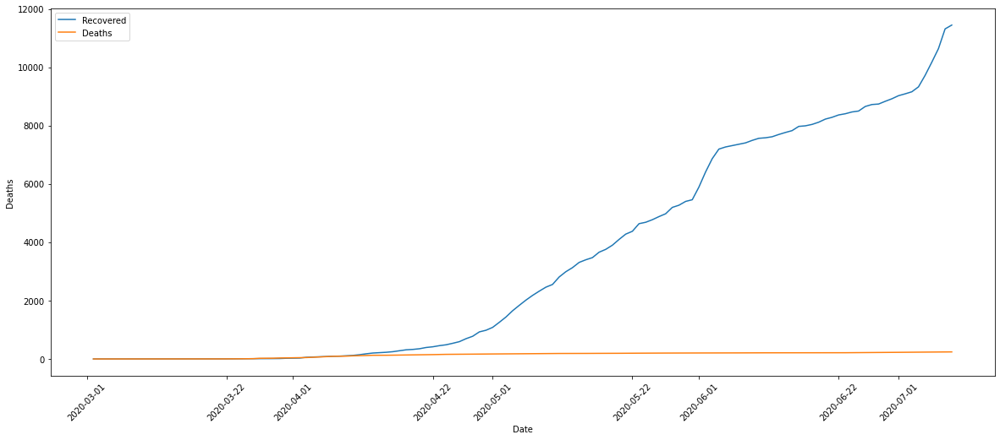

In [8]:
## Plot of recovered and Death cases (Death Rate is critical)
lineplot(mar_data, ['Recovered', 'Deaths'])

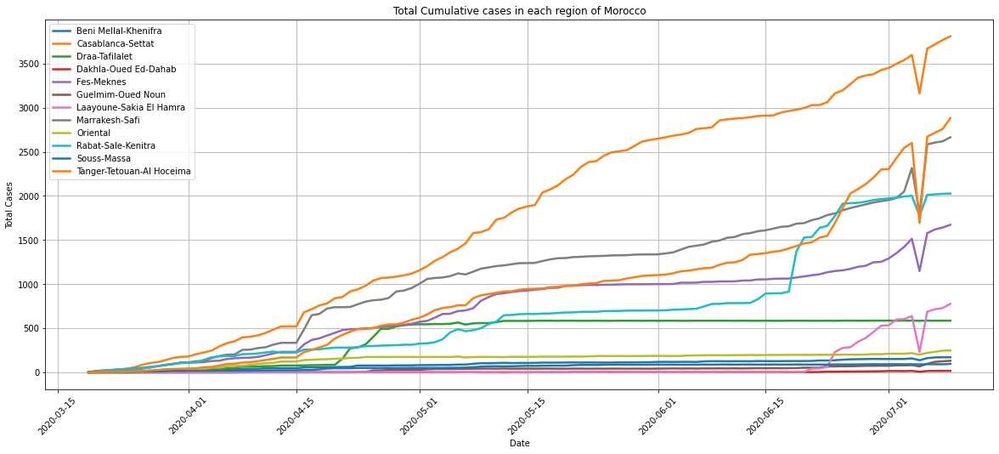

In [9]:
plt.figure(figsize=(20, 8))
for col in mar_data.columns[5:].to_list():
    sns.lineplot(x='Date', y=col, data = mar_data.iloc[17:], label=col, linewidth=2.5)

plt.title(f'Total Cumulative cases in each region of Morocco')
plt.xlabel("Date")
plt.ylabel("Total Cases")
plt.xticks(rotation=45)
plt.grid()
plt.legend();

In [10]:
# Coordinates of India States and Union Territories
maroc_coord = pd.read_excel('E:/S2/modelisation/projet/MLcorona/info/maroc-Coordinates.xlsx')

In [11]:
maroc_coord

,Name of State / UT,Latitude,Longitude
0,Beni Mellal-Khenifra,32.640750,-6.207105
1,Casablanca-Settat,33.262713,-7.963903
2,Draa-Tafilalet,31.183543,-5.139543
3,Dakhla-Oued Ed-Dahab,23.283710,-15.020262
4,Fes-Meknes,33.833314,-4.855638
5,Guelmim-Oued Noun,28.527370,-10.031551
6,Laayoune-Sakia El Hamra,26.730094,-12.976677
7,Marrakesh-Safi,31.625826,-7.989161
8,Oriental,33.320214,-2.423847
9,Rabat-Sale-Kenitra,33.920433,-6.367609


In [131]:
som = pd.read_excel('./info/maroc-Coordinates-som.xlsx')

In [132]:
som

,Name of State / UT,Total Active
0,Beni Mellal-Khenifra,171
1,Casablanca-Settat,3809
2,Draa-Tafilalet,587
3,Dakhla-Oued Ed-Dahab,17
4,Fes-Meknes,1673
5,Guelmim-Oued Noun,132
6,Laayoune-Sakia El Hamra,777
7,Marrakesh-Safi,2665
8,Oriental,248
9,Rabat-Sale-Kenitra,2027


In [135]:
# Learn how to use folium to create a zoomable map
df_ful = pd.merge(maroc_coord,som,on='Name of State / UT')
map = folium.Map(location=[33.62600600526357, -6.045401465624997], zoom_start=4,tiles='Stamenterrain')

for lat, lon, value, name in zip(df_ful['Latitude'], df_ful['Longitude'], df_ful['Total Active'], df_ful['Name of State / UT']):
    folium.CircleMarker([lat, lon], radius=value*0.01, popup = ('<strong>State</strong>: ' + str(name).capitalize() + '<br>''<strong>Total Cases</strong>: ' + str(value) + '<br>'),color='red',fill_color='red',fill_opacity=0.3 ).add_to(map)
map


In [136]:
map.save('Cas_Actifs.html')

# Part 2: Analysing the present condition in India

**How it started in India?:** 

The first **COVID-19** case was reported on 30th January 2020 when a student arrived **Kerala** from Wuhan. Just in next 2 days, Kerela reported 2 more cases. For almost a month, no new cases were reported in India, however, on 2nd March 2020, five new cases of corona virus were reported in Kerala again and since then the cases have been rising affecting **25** states, till now *(Bihar and Manipur being the most recent)*. Here is a brief timeline of the cases in India.
###COVID-19 in India - Timeline
 <br>


![](https://i.imgur.com/jUwp2jc.png)

In [16]:
#Learn how to read a .xls file by creating a dataframe using pandas
# Reading the datasets
df= pd.read_excel('E:/S2/modelisation/projet/MLcorona/info/Covid cases in India.xlsx')
df_india = df.copy()
df
#warning :: the data last update is 2 April 

,S. No.,Name of State / UT,Total Confirmed cases (Indian National),Total Confirmed cases ( Foreign National ),Cured,Death
0,1,Andhra Pradesh,9,0,0,0
1,2,Bihar,3,0,0,1
2,3,Chhattisgarh,1,0,0,0
3,4,Delhi,30,1,6,1
4,5,Gujarat,32,1,0,1
5,6,Haryana,14,14,11,0
6,7,Himachal Pradesh,3,0,0,1
7,8,Karnataka,41,0,3,1
8,9,Kerala,101,8,4,0
9,10,Madhya Pradesh,9,0,0,0


In [17]:
# Coordinates of India States and Union Territories
India_coord = pd.read_excel('E:/S2/modelisation/projet/MLcorona/info/Indian-Coordinates.xlsx')

In [18]:
India_coord

,Name of State / UT,Latitude,Longitude
0,Andaman And Nicobar,11.667026,92.735983
1,Andhra Pradesh,14.750429,78.570026
2,Arunachal Pradesh,27.100399,93.616601
3,Assam,26.749981,94.216667
4,Bihar,25.785414,87.479973
5,Chandigarh,30.719997,76.780006
6,Chhattisgarh,22.090420,82.159987
7,Dadra And Nagar Haveli,20.266578,73.016618
8,Delhi,28.669993,77.230004
9,Goa,15.491997,73.818001


In [19]:
#Day by day data of India, Korea, Italy and Wuhan
dbd_India = pd.read_excel('E:/S2/modelisation/projet/MLcorona/info//per_day_cases.xlsx',parse_dates=True, sheet_name='India')
dbd_Italy = pd.read_excel('E:/S2/modelisation/projet/MLcorona/info//per_day_cases.xlsx',parse_dates=True, sheet_name="Italy")
dbd_Korea = pd.read_excel('E:/S2/modelisation/projet/MLcorona/info//per_day_cases.xlsx',parse_dates=True, sheet_name="Korea")
dbd_Wuhan = pd.read_excel('E:/S2/modelisation/projet/MLcorona/info//per_day_cases.xlsx',parse_dates=True, sheet_name="Wuhan")

# 1.1 Analysing COVID19 Cases in India

In [20]:
#Learn how to play around with the dataframe and create a new attribute of 'Total Case'
#Total case is the total number of confirmed cases (Indian National + Foreign National)
df['Total cases'] = df['Total Confirmed cases (Indian National)'] + df['Total Confirmed cases ( Foreign National )']
total_cases = df['Total cases'].sum()
print('Total number of confirmed COVID 2019 cases across India till date (22nd March, 2020):', total_cases)

Total number of confirmed COVID 2019 cases across India till date (22nd March, 2020): 562


In [21]:
#Learn how to highlight your dataframe
df.style.background_gradient(cmap='Blues')

,S. No.,Name of State / UT,Total Confirmed cases (Indian National),Total Confirmed cases ( Foreign National ),Cured,Death,Total cases
0,1,Andhra Pradesh,9,0,0,0,9
1,2,Bihar,3,0,0,1,3
2,3,Chhattisgarh,1,0,0,0,1
3,4,Delhi,30,1,6,1,31
4,5,Gujarat,32,1,0,1,33
5,6,Haryana,14,14,11,0,28
6,7,Himachal Pradesh,3,0,0,1,3
7,8,Karnataka,41,0,3,1,41
8,9,Kerala,101,8,4,0,109
9,10,Madhya Pradesh,9,0,0,0,9


## 1.3 Number of Active COVID-19 cases in affected State/Union Territories   

In [22]:
#Total Active  is the Total cases - (Number of death + Cured)
df['Total Active'] = df['Total cases'] - (df['Death'] + df['Cured'])
total_active = df['Total Active'].sum()
print('Total number of active COVID 2019 cases across India:', total_active)
Tot_Cases = df.groupby('Name of State / UT')['Total Active'].sum().sort_values(ascending=False).to_frame()
Tot_Cases.style.background_gradient(cmap='Reds')

Total number of active COVID 2019 cases across India: 512


,Total Active
Name of State / UT,
Kerala,105
Maharashtra,99
Karnataka,37
Telengana,34
Gujarat,32
Rajasthan,29
Punjab,28
Uttar Pradesh,24
Delhi,24


## 1.4 Visualising the spread geographically

In [23]:
India_coord

,Name of State / UT,Latitude,Longitude
0,Andaman And Nicobar,11.667026,92.735983
1,Andhra Pradesh,14.750429,78.570026
2,Arunachal Pradesh,27.100399,93.616601
3,Assam,26.749981,94.216667
4,Bihar,25.785414,87.479973
5,Chandigarh,30.719997,76.780006
6,Chhattisgarh,22.090420,82.159987
7,Dadra And Nagar Haveli,20.266578,73.016618
8,Delhi,28.669993,77.230004
9,Goa,15.491997,73.818001


In [24]:
# Learn how to use folium to create a zoomable map
df_full = pd.merge(India_coord,df,on='Name of State / UT')
map = folium.Map(location=[20, 70], zoom_start=4,tiles='Stamenterrain')

for lat, lon, value, name in zip(df_full['Latitude'], df_full['Longitude'], df_full['Total cases'], df_full['Name of State / UT']):
    folium.CircleMarker([lat, lon], radius=value*0.8, popup = ('<strong>State</strong>: ' + str(name).capitalize() + '<br>''<strong>Total Cases</strong>: ' + str(value) + '<br>'),color='red',fill_color='red',fill_opacity=0.3 ).add_to(map)
map

In [25]:
df_full

,Name of State / UT,Latitude,Longitude,S. No.,Total Confirmed cases (Indian National),Total Confirmed cases ( Foreign National ),Cured,Death,Total cases,Total Active
0,Andhra Pradesh,14.750429,78.570026,1,9,0,0,0,9,9
1,Chandigarh,30.719997,76.780006,20,7,0,0,0,7,7
2,Delhi,28.669993,77.230004,4,30,1,6,1,31,24
3,Haryana,28.450006,77.019991,6,14,14,11,0,28,17
4,Jammu and Kashmir,33.450000,76.240000,21,7,0,1,0,7,6
5,Karnataka,12.570381,76.919997,8,41,0,3,1,41,37
6,Kerala,8.900373,76.569993,9,101,8,4,0,109,105
7,Maharashtra,19.250232,73.160175,11,98,3,0,2,101,99
8,Odisha,19.820430,85.900017,14,2,0,0,0,2,2
9,Punjab,31.519974,75.980003,16,29,0,0,1,29,28


## 1.5 Confirmed vs Recovered figures

In [26]:
#Learn how to create interactive graphs using plotly
# import plotly.graph_objects as go
# Rise of COVID-19 cases in India
fig = go.Figure()
fig.add_trace(go.Scatter(x=dbd_India['Date'], y = dbd_India['Total Cases'], mode='lines+markers',name='Total Cases'))
fig.update_layout(title_text='Trend of Coronavirus Cases in India (Cumulative cases)',plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [27]:
# New COVID-19 cases reported daily in India

import plotly.express as px
fig = px.bar(dbd_India, x="Date", y="New Cases", barmode='group', height=400)
fig.update_layout(title_text='Coronavirus Cases in India on daily basis',plot_bgcolor='rgb(230, 230, 230)')

fig.show()

# Part 3: Is the trend similar to Italy/ S.Korea/ Wuhan/india?

In [28]:
data_maroc['Total cases'] = data_maroc['Confirmed'] - (data_maroc['Deaths']+data_maroc['Recovered'])


In [29]:
data_maroc.tail(5)

,Date,Confirmed,Deaths,Recovered,Excluded,Beni Mellal-Khenifra,Casablanca-Settat,Draa-Tafilalet,Dakhla-Oued Ed-Dahab,Fes-Meknes,Guelmim-Oued Noun,Laayoune-Sakia El Hamra,Marrakesh-Safi,Oriental,Rabat-Sale-Kenitra,Souss-Massa,Tanger-Tetouan-Al Hoceima,Total cases
125,05/07/2020,14215.0,235.0,9725.0,751365.0,138.0,3161.0,585.0,8.0,1149.0,68.0,231.0,1802.0,200.0,1773.0,90.0,1693.0,4255.0
126,06/07/2020,14379.0,237.0,10173.0,769260.0,162.0,3670.0,587.0,16.0,1579.0,98.0,688.0,2584.0,222.0,2012.0,93.0,2672.0,3969.0
127,07/07/2020,14607.0,240.0,10639.0,786722.0,170.0,3718.0,586.0,17.0,1620.0,120.0,716.0,2605.0,233.0,2018.0,93.0,2716.0,3728.0
128,08/07/2020,14771.0,242.0,11316.0,804353.0,172.0,3767.0,587.0,17.0,1642.0,126.0,729.0,2619.0,247.0,2024.0,92.0,2758.0,3213.0
129,09/07/2020,15079.0,242.0,11447.0,820185.0,171.0,3809.0,587.0,17.0,1673.0,132.0,777.0,2665.0,248.0,2027.0,97.0,2882.0,3390.0


In [30]:
# import plotly.express as px
#Confirmed Cases in Morocco
fig = px.bar(data_maroc, x="Date", y="Total cases", color='Total cases', orientation='v', 
             title='Confirmed Cases in Morocco', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [31]:
dbd_India.tail

<bound method NDFrame.tail of          Date  Total Cases  New Cases  Days after surpassing 100 cases
0  2020-01-30            1          1                              NaN
1  2020-01-31            1          0                              NaN
2  2020-02-01            1          0                              NaN
3  2020-02-02            2          1                              NaN
4  2020-02-03            3          1                              NaN
5  2020-02-04            3          0                              NaN
6  2020-02-05            3          0                              NaN
7  2020-02-06            3          0                              NaN
8  2020-02-07            3          0                              NaN
9  2020-02-08            3          0                              NaN
10 2020-02-09            3          0                              NaN
11 2020-02-10            3          0                              NaN
12 2020-02-11            3          0          

In [32]:
#Confirmed Cases in India
fig = px.bar(dbd_India, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in India', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [33]:
dbd_Italy

,Date,Total Cases,New Cases,Days after surpassing 100 cases
0,2020-01-31,2,2,NaN
1,2020-02-01,2,0,NaN
2,2020-02-02,2,0,NaN
3,2020-02-03,2,0,NaN
4,2020-02-04,2,0,NaN
5,2020-02-05,2,0,NaN
6,2020-02-06,3,1,NaN
7,2020-02-07,3,0,NaN
8,2020-02-08,3,0,NaN
9,2020-02-09,3,0,NaN


In [34]:
dbd_Italy

,Date,Total Cases,New Cases,Days after surpassing 100 cases
0,2020-01-31,2,2,NaN
1,2020-02-01,2,0,NaN
2,2020-02-02,2,0,NaN
3,2020-02-03,2,0,NaN
4,2020-02-04,2,0,NaN
5,2020-02-05,2,0,NaN
6,2020-02-06,3,1,NaN
7,2020-02-07,3,0,NaN
8,2020-02-08,3,0,NaN
9,2020-02-09,3,0,NaN


In [35]:
#Confirmed Cases in Italy
fig = px.bar(dbd_Italy, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in Italy', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [36]:
dbd_Korea

,Date,Total Cases,New Cases,Days after surpassing 100 cases
0,2020-01-20,1,1,NaN
1,2020-01-21,1,0,NaN
2,2020-01-22,1,0,NaN
3,2020-01-23,1,0,NaN
4,2020-01-24,2,1,NaN
...,...,...,...,...
60,2020-03-20,8652,87,29.0
61,2020-03-21,8799,147,30.0
62,2020-03-22,8961,162,31.0
63,2020-03-23,8961,0,32.0


In [37]:
#Confirmed Cases in South Korea
fig = px.bar(dbd_Korea, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in South Korea', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [38]:
dbd_Wuhan

,Date,Total Cases,New Cases
0,2020-01-22,444,0
1,2020-01-23,444,0
2,2020-01-24,549,105
3,2020-01-25,761,212
4,2020-01-26,1058,297
...,...,...,...
58,2020-03-20,67800,0
59,2020-03-21,67800,0
60,2020-03-22,67800,0
61,2020-03-23,67800,0


In [39]:
#Confirmed Cases in Wuhan
fig = px.bar(dbd_Wuhan, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in Wuhan', color_discrete_sequence = px.colors.cyclical.IceFire)

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

# Visualization Inference:
    Confirmed cases in Morroco is rising exponentially with no fixed pattern (Very less test in morrocco)
    Confirmed cases in Italy is rising exponentially with certain fixed pattern
    Confirmed cases in S.Korea is rising gradually
    There has been only 3 confirmed cases in Wuhan since last week, They have almost controlled the COVID-19 ,but in 13April they annonced 136 new cases .

# Comparison between the rise of cases in Morroco Wuhan, S.Korea, Italy and India

In [40]:
#Learn how to create subplots using plotly
# import plotly.graph_objects as go 
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=2, cols=2,
    specs=[[{}, {}],
           [{"colspan": 2}, None]],
    subplot_titles=("Italy","India", "MORROCO"))

fig.add_trace(go.Bar(x=dbd_Italy['Date'], y=dbd_Italy['Total Cases'],
                    marker=dict(color=dbd_Italy['Total Cases'], coloraxis="coloraxis")),1, 2)


fig.add_trace(go.Bar(x=dbd_India['Date'], y=dbd_India['Total Cases'],
                    marker=dict(color=dbd_India['Total Cases'], coloraxis="coloraxis")),1, 1)

fig.add_trace(go.Bar(x=data_maroc['Date'], y=data_maroc['Total cases'],
                    marker=dict(color=data_maroc['Total cases'],coloraxis="coloraxis")),2, 1)

fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=False,title_text="Total Confirmed cases(Cumulative)")

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

# Part 4: Exploring World wide data

In [41]:
#read data
df = pd.read_csv('E:/S2/modelisation/projet/MLcorona/info/covid_19_clean_complete.csv',parse_dates=['Date'])
df.rename(columns={'ObservationDate':'Date', 'Country/Region':'Country'}, inplace=True)

df_confirmed = pd.read_csv("E:/S2/modelisation/projet/MLcorona/info/time_series_covid19_confirmed_global.csv")
df_recovered = pd.read_csv("E:/S2/modelisation/projet/MLcorona/info/time_series_covid19_recovered_global.csv")
df_deaths = pd.read_csv("E:/S2/modelisation/projet/MLcorona/info/time_series_covid19_deaths_global.csv")

df_confirmed.rename(columns={'Country/Region':'Country'}, inplace=True)
df_recovered.rename(columns={'Country/Region':'Country'}, inplace=True)
df_deaths.rename(columns={'Country/Region':'Country'}, inplace=True)

# data Visualization

In [42]:
df_deaths

,Province/State,Country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20
0,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,1,1,1,2,2,2,2,2,4,5
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,4,4,4,7,9,11,15,17,17,19
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,NaN,Timor-Leste,-8.874217,125.727539,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
237,NaN,Belize,13.193900,-59.543200,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
238,Recovered,Canada,0.000000,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,NaN,Laos,19.856270,102.495496,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
df

,Province/State,Country,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Thailand,15.0000,101.0000,2020-01-22,2.0,0.0,0.0
1,NaN,Japan,36.0000,138.0000,2020-01-22,2.0,0.0,0.0
2,NaN,Singapore,1.2833,103.8333,2020-01-22,0.0,0.0,0.0
3,NaN,Nepal,28.1667,84.2500,2020-01-22,0.0,0.0,0.0
4,NaN,Malaysia,2.5000,112.5000,2020-01-22,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
19215,NaN,Jersey,49.1900,-2.1100,2020-03-23,0.0,0.0,0.0
19216,NaN,Puerto Rico,18.2000,-66.5000,2020-03-23,0.0,1.0,0.0
19217,NaN,Republic of the Congo,-1.4400,15.5560,2020-03-23,0.0,0.0,0.0
19218,NaN,The Bahamas,24.2500,-76.0000,2020-03-23,0.0,0.0,0.0


In [44]:
df2 = df.groupby(["Date", "Country", "Province/State"])[['Date', 'Province/State', 'Country', 'Confirmed', 'Deaths', 'Recovered']].sum().reset_index()
df2.head()

,Date,Country,Province/State,Confirmed,Deaths,Recovered
0,2020-01-22,Australia,Australian Capital Territory,0.0,0.0,0.0
1,2020-01-22,Australia,From Diamond Princess,0.0,0.0,0.0
2,2020-01-22,Australia,New South Wales,0.0,0.0,0.0
3,2020-01-22,Australia,Northern Territory,0.0,0.0,0.0
4,2020-01-22,Australia,Queensland,0.0,0.0,0.0


In [45]:
# Check for India's data
df.query('Country=="India"').groupby("Date")[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Date,Confirmed,Deaths,Recovered
0,2020-01-22,0.0,0.0,0.0
1,2020-01-23,0.0,0.0,0.0
2,2020-01-24,0.0,0.0,0.0
3,2020-01-25,0.0,0.0,0.0
4,2020-01-26,0.0,0.0,0.0
...,...,...,...,...
57,2020-03-19,194.0,4.0,15.0
58,2020-03-20,244.0,5.0,20.0
59,2020-03-21,330.0,4.0,23.0
60,2020-03-22,396.0,7.0,27.0


In [46]:
#Overall worldwide Confirmed/ Deaths/ Recovered cases 
world_data = df.groupby('Date').sum()

In [47]:
world_data

,Lat,Long,Confirmed,Deaths,Recovered
Date,,,,,
2020-01-22,7777.4793,1639.7021,554.0,17.0,28.0
2020-01-23,7777.4793,1639.7021,652.0,18.0,30.0
2020-01-24,7777.4793,1639.7021,939.0,26.0,36.0
2020-01-25,7777.4793,1639.7021,1432.0,42.0,39.0
2020-01-26,7777.4793,1639.7021,2113.0,56.0,52.0
...,...,...,...,...,...
2020-03-19,7777.4793,1639.7021,242708.0,9867.0,84854.0
2020-03-20,7777.4793,1639.7021,272166.0,11299.0,87256.0
2020-03-21,7777.4793,1639.7021,304524.0,12973.0,91499.0


# Visualizing: Worldwide NCOVID-19 cases

warning :: between 12 and 13 there a problem in contient the cases confirmed by the WHO (world health organization)

# Part 4: Machine Learning

## Prophet
Prophet is open source software released by Facebook’s Core Data Science team. It is available for download on CRAN and PyPI.

We use Prophet, a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well. 

## Why Prophet?

* **Accurate and fast:**  Prophet is used in many applications across Facebook for producing reliable forecasts for planning and goal setting. Facebook finds it to perform better than any other approach in the majority of cases. It fit models in [Stan](https://mc-stan.org/) so that you get forecasts in just a few seconds.

* **Fully automatic:** Get a reasonable forecast on messy data with no manual effort. Prophet is robust to outliers, missing data, and dramatic changes in your time series.

* **Tunable forecasts:** The Prophet procedure includes many possibilities for users to tweak and adjust forecasts. You can use human-interpretable parameters to improve your forecast by adding your domain knowledge

* **Available in R or Python:** Facebook has implemented the Prophet procedure in R and Python. Both of them share the same underlying Stan code for fitting. You can use whatever language you’re comfortable with to get forecasts. 

In [50]:
from fbprophet import Prophet


In [51]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()

The input to Prophet is always a dataframe with two columns: ds and y. The ds (datestamp) column should be of a format expected by Pandas, ideally YYYY-MM-DD for a date or YYYY-MM-DD HH:MM:SS for a timestamp. The y column must be numeric, and represents the measurement we wish to forecast.

In [52]:
confirmed.columns = ['ds','y']
#confirmed['ds'] = confirmed['ds'].dt.date
confirmed['ds'] = pd.to_datetime(confirmed['ds'])

In [53]:
confirmed

,ds,y
0,2020-01-22,554.0
1,2020-01-23,652.0
2,2020-01-24,939.0
3,2020-01-25,1432.0
4,2020-01-26,2113.0
...,...,...
57,2020-03-19,242708.0
58,2020-03-20,272166.0
59,2020-03-21,304524.0
60,2020-03-22,335955.0


# 4-1Generate a forecast for a week ahead

Generating a week ahead forecast of confirmed cases of NCOVID-19 using Prophet, with 95% prediction interval by creating a base model with no tweaking of seasonality-related parameters and additional regressors

In [54]:
m = Prophet(interval_width=0.95)
m.fit(confirmed)
future = m.make_future_dataframe(periods=7)
future

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
0,2020-01-22
1,2020-01-23
2,2020-01-24
3,2020-01-25
4,2020-01-26
...,...
64,2020-03-26
65,2020-03-27
66,2020-03-28
67,2020-03-29


The predict method will assign each row in future a predicted value which it names yhat. If you pass in historical dates, it will provide an in-sample fit. The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.

In [55]:
#predicting the future with date, and upper and lower limit of y value
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
64,2020-03-26,355136.872975,335099.280565,374492.796766
65,2020-03-27,372235.326939,350668.811705,391881.861123
66,2020-03-28,388674.964143,367154.206460,408160.459412
67,2020-03-29,405307.954676,382075.306110,427235.368744
68,2020-03-30,418529.648467,394890.210754,441102.890683


In [56]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-22,-9486.252089,-29163.983326,11742.786605
1,2020-01-23,-5987.933708,-28392.236390,14796.647629
2,2020-01-24,-1506.538955,-21109.586049,18569.699146
3,2020-01-25,2316.039046,-18654.513101,21950.568069
4,2020-01-26,6331.970375,-12823.930041,27011.557686
...,...,...,...,...
64,2020-03-26,355136.872975,335099.280565,374492.796766
65,2020-03-27,372235.326939,350668.811705,391881.861123
66,2020-03-28,388674.964143,367154.206460,408160.459412
67,2020-03-29,405307.954676,382075.306110,427235.368744


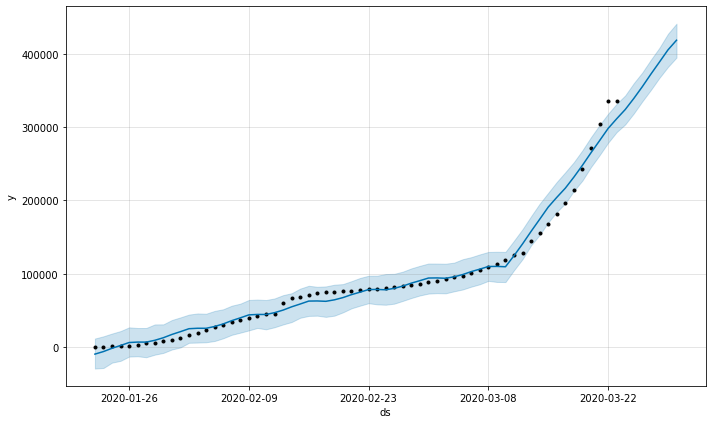

In [57]:
confirmed_forecast_plot = m.plot(forecast)

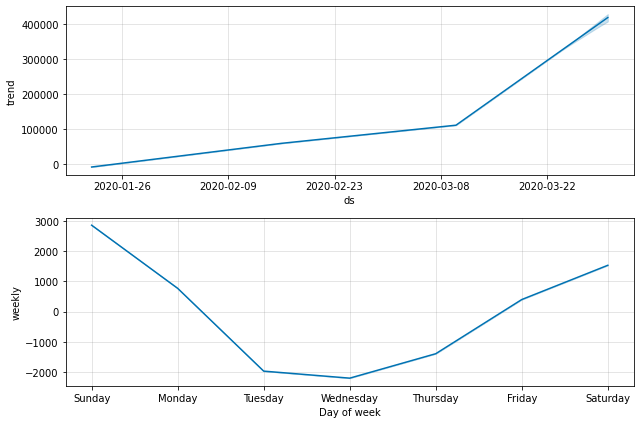

In [58]:
confirmed_forecast_plot =m.plot_components(forecast)

You can plot the forecast by calling the Prophet.plot method and passing in your forecast dataframe.

# 4.2 Forecasting Worldwide Deaths using Prophet


Generating a week ahead forecast of confirmed cases of NCOVID-19 using Prophet, with 95% prediction interval by creating a base model with no tweaking of seasonality-related parameters and additional regressors.

In [59]:
deaths

,Date,Deaths
0,2020-01-22,17.0
1,2020-01-23,18.0
2,2020-01-24,26.0
3,2020-01-25,42.0
4,2020-01-26,56.0
...,...,...
57,2020-03-19,9867.0
58,2020-03-20,11299.0
59,2020-03-21,12973.0
60,2020-03-22,14632.0


In [60]:
deaths.columns = ['ds','y']
deaths['ds'] = pd.to_datetime(deaths['ds'])

In [61]:
deaths

,ds,y
0,2020-01-22,17.0
1,2020-01-23,18.0
2,2020-01-24,26.0
3,2020-01-25,42.0
4,2020-01-26,56.0
...,...,...
57,2020-03-19,9867.0
58,2020-03-20,11299.0
59,2020-03-21,12973.0
60,2020-03-22,14632.0


In [62]:
m = Prophet(interval_width=0.95)
m.fit(deaths)
future = m.make_future_dataframe(periods=7)
future

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
0,2020-01-22
1,2020-01-23
2,2020-01-24
3,2020-01-25
4,2020-01-26
...,...
64,2020-03-26
65,2020-03-27
66,2020-03-28
67,2020-03-29


In [63]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-22,-514.655334,-1450.488898,409.702393
1,2020-01-23,-451.453923,-1356.601303,440.953370
2,2020-01-24,-309.165536,-1219.793837,583.496128
3,2020-01-25,-147.330221,-1086.048736,825.303970
4,2020-01-26,31.818901,-919.709960,930.372408
...,...,...,...,...
64,2020-03-26,15411.877522,14445.021724,16332.540595
65,2020-03-27,16199.617603,15288.697232,17110.949862
66,2020-03-28,17006.904589,16027.879766,18043.224413
67,2020-03-29,17831.505383,16846.557816,18838.678960


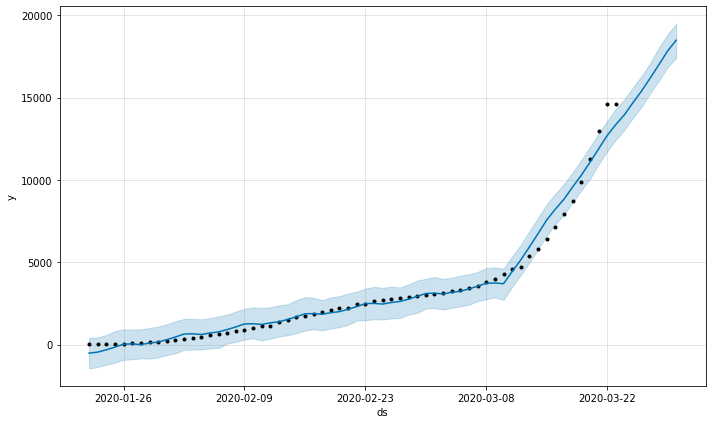

In [64]:
deaths_forecast_plot = m.plot(forecast)

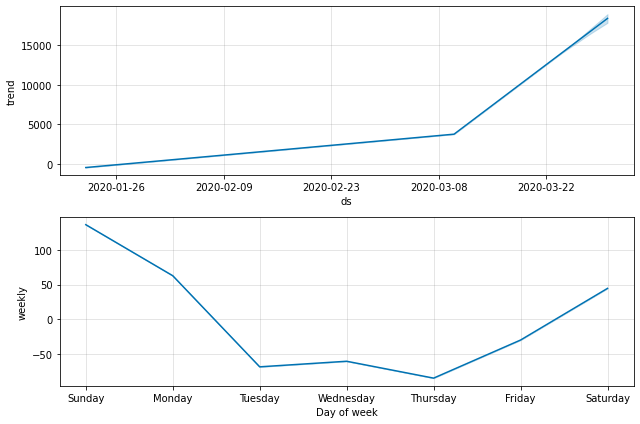

In [65]:
deaths_forecast_plot = m.plot_components(forecast)

# 4.3 Forecasting MAROC Confirmed cases using Prophet

In [174]:
maroc_coord.tail(10)

,Date,Confirmed,Deaths,Recovered,Excluded,Beni Mellal-Khenifra,Casablanca-Settat,Draa-Tafilalet,Dakhla-Oued Ed-Dahab,Fes-Meknes,Guelmim-Oued Noun,Laayoune-Sakia El Hamra,Marrakesh-Safi,Oriental,Rabat-Sale-Kenitra,Souss-Massa,Tanger-Tetouan-Al Hoceima
120,2020-06-30,12533.0,228.0,8920.0,668658.0,152.0,3427.0,587.0,13.0,1253.0,76.0,529.0,1941.0,206.0,1964.0,92.0,2299.0
121,2020-07-01,12636.0,228.0,9026.0,685492.0,152.0,3450.0,587.0,16.0,1292.0,75.0,535.0,1953.0,212.0,1973.0,93.0,2304.0
122,2020-07-02,12969.0,229.0,9090.0,702884.0,152.0,3497.0,587.0,16.0,1352.0,81.0,600.0,1977.0,212.0,1980.0,93.0,2430.0
123,2020-07-03,13288.0,230.0,9160.0,719206.0,152.0,3539.0,587.0,15.0,1422.0,80.0,605.0,2050.0,212.0,1994.0,92.0,2545.0
124,2020-07-04,13822.0,232.0,9329.0,734627.0,159.0,3598.0,587.0,17.0,1515.0,83.0,639.0,2316.0,219.0,2002.0,93.0,2600.0
125,2020-07-05,14215.0,235.0,9725.0,751365.0,138.0,3161.0,585.0,8.0,1149.0,68.0,231.0,1802.0,200.0,1773.0,90.0,1693.0
126,2020-07-06,14379.0,237.0,10173.0,769260.0,162.0,3670.0,587.0,16.0,1579.0,98.0,688.0,2584.0,222.0,2012.0,93.0,2672.0
127,2020-07-07,14607.0,240.0,10639.0,786722.0,170.0,3718.0,586.0,17.0,1620.0,120.0,716.0,2605.0,233.0,2018.0,93.0,2716.0
128,2020-07-08,14771.0,242.0,11316.0,804353.0,172.0,3767.0,587.0,17.0,1642.0,126.0,729.0,2619.0,247.0,2024.0,92.0,2758.0
129,2020-07-09,15079.0,242.0,11447.0,820185.0,171.0,3809.0,587.0,17.0,1673.0,132.0,777.0,2665.0,248.0,2027.0,97.0,2882.0


In [175]:
maroc_coord["Date"] = pd.to_datetime(maroc_coord['Date'], dayfirst=True)
maroc_coord["Date"].dtype

dtype('<M8[ns]')

In [176]:
#R0 taux de reproduction :: 
N=40000000
S0=1
T=0
#la date 
R0_date= R0_moroco['Date'].copy()

R0_date_w=[]
for i in range(0,len(R0_moroco['Date']),7):
    R0_date_w.append(R0_moroco['Date'][i])

R0_date_m=[]
for i in range(0,len(R0_moroco['Date']),30):
    R0_date_m.append(R0_moroco['Date'][i])
#beta/gamma
liste_R0=[]
liste_R0_w=[]
liste_R0_m=[]
drapo=1

#R0/day
for i in range(len(R0_moroco['Confirmed'])):
    if(drapo==1):
        liste_R0.append(1.0)
        drapo=0
    else:
        if(R0_moroco['Confirmed'][i-1]!=0):
            liste_R0.append(R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])
        else:
            liste_R0.append(R0_moroco['Confirmed'][i]/1)
        T=T+R0_moroco['Confirmed'][i]

#R0/week
drapo=1
week_confir=0
e_confir=1.0
for i in range(len(R0_moroco['Confirmed'])):
    if(drapo==1):
        liste_R0.append(1.0)
        drapo=0
    if(i%7!=0):
        week_confir=week_confir+R0_moroco['Confirmed'][i]
    if(i%7==0):
        if(e_confir!=0):
            liste_R0_w.append(week_confir/e_confir)
        else:
            liste_R0_w.append(week_confir/1)
        e_confir=week_confir
        week_confir=0  
    
#R0/month
drapo=1
month_confir=0
e_confir=1.0
for i in range(len(R0_moroco['Confirmed'])):
    if(drapo==1):
        liste_R0.append(1.0)
        drapo=0
    if(i%30!=0):
        month_confir=month_confir+R0_moroco['Confirmed'][i]
    if(i%30==0):
        if(e_confir!=0):
            liste_R0_m.append(week_confir/e_confir)
        else:
            liste_R0_m.append(week_confir/1)
        e_confir=month_confir
        month_confir=0  
#plot R0
# import plotly.graph_objects as go
# Rise of COVID-19 cases in India
fig = go.Figure()
fig.add_trace(go.Scatter(x=R0_date, y = liste_R0, mode='lines+markers',name='R0 / jour  '))
fig.add_trace(go.Scatter(x=R0_date_w, y = liste_R0_w, mode='lines+markers',name='R0 / mois'))
#fig.add_trace(go.Scatter(x=R0_date_w, y = liste_R0_m, mode='lines+markers',name='R0 by month'))
fig.update_layout(title_text='R0',plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [69]:

liste_R0

[1.0,
 0.0,
 1.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 2.0,
 0.5,
 0.0,
 1.0,
 10.0,
 1.1,
 0.8181818181818182,
 0.7777777777777778,
 2.0,
 0.35714285714285715,
 4.6,
 0.43478260869565216,
 1.3,
 2.6153846153846154,
 0.7941176470588235,
 2.037037037037037,
 0.9090909090909091,
 1.4,
 0.8142857142857143,
 1.3508771929824561,
 1.0,
 0.7922077922077922,
 0.6065573770491803,
 1.4594594594594594,
 1.537037037037037,
 1.5421686746987953,
 0.796875,
 0.9705882352941176,
 0.6464646464646465,
 1.421875,
 1.0879120879120878,
 0.7474747474747475,
 1.3108108108108107,
 1.1958762886597938,
 0.8793103448275862,
 1.2254901960784315,
 1.088,
 1.9044117647058822,
 1.084942084942085,
 0.4306049822064057,
 1.4049586776859504,
 1.1235294117647059,
 0.8534031413612565,
 1.4539877300613497,
 0.5147679324894515,
 1.5573770491803278,
 0.7315789473684211,
 1.20863309352518,
 0.3273809523809524,
 2.4,
 0.5227272727272727,
 1.0,
 1.0]

# Confinement

In [142]:
#beta le taux d'infection par chaque jour  , gamma le taux de guerir
N=40000000
S0=1
T=0
#la date 
R0_dat= R0_moroco['Date'].copy()


#beta/gamma
liste_R0_0=[]
liste_R0_10=[]
liste_R0_30=[]
liste_R0_70=[]
liste_R0_90=[]
liste_R0_99=[]
liste_R0_=[]
liste_R0_m=[]
drapo=1

#R0/day
for i in range(len(R0_moroco['Confirmed'])):
    if(drapo==1):
        liste_R0_99.append(1.0)
        liste_R0_90.append(1.0)
        liste_R0_70.append(1.0)
        liste_R0_30.append(1.0)
        liste_R0_10.append(1.0)
        liste_R0_0.append(1.0)
        drapo=0
    else:
        if(R0_moroco['Confirmed'][i-1]!=0):
            liste_R0_0.append((R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])*1)
            liste_R0_10.append((R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])*0.9)
            liste_R0_30.append((R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])*0.7)
            liste_R0_70.append((R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])*0.3)
            liste_R0_90.append((R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])*0.1)
            liste_R0_99.append((R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])*0.001)
            
        else:
            liste_R0_0.append((R0_moroco['Confirmed'][i]/1)*1)
            liste_R0_10.append((R0_moroco['Confirmed'][i]/1)*0.9)
            liste_R0_30.append((R0_moroco['Confirmed'][i]/1)*0.7)
            liste_R0_70.append((R0_moroco['Confirmed'][i]/1)*0.3)
            liste_R0_90.append((R0_moroco['Confirmed'][i]/1)*0.1)
            liste_R0_99.append((R0_moroco['Confirmed'][i]/1)*0.001)
        T=T+R0_moroco['Confirmed'][i]

 
    
 
 #plot R0
# import plotly.graph_objects as go
# Rise of COVID-19 cases in India
fig = go.Figure()
fig.add_trace(go.Scatter(x=R0_dat, y = liste_R0_0, mode='lines+markers',name='R0/ - 0%  '))
fig.add_trace(go.Scatter(x=R0_dat, y = liste_R0_10, mode='lines+markers',name='R0/ - 10%  '))
fig.add_trace(go.Scatter(x=R0_dat, y = liste_R0_30, mode='lines+markers',name='R0/ - 30%  '))
fig.add_trace(go.Scatter(x=R0_dat, y = liste_R0_70, mode='lines+markers',name='R0/ - 70%  '))
fig.add_trace(go.Scatter(x=R0_dat, y = liste_R0_90, mode='lines+markers',name='R0/ - 90%  '))
fig.add_trace(go.Scatter(x=R0_dat, y = liste_R0_99, mode='lines+markers',name='R0/ - 99%  '))
#fig.add_trace(go.Scatter(x=R0_date_w, y = liste_R0_w, mode='lines+markers',name='R0 by week'))
#fig.add_trace(go.Scatter(x=R0_date_w, y = liste_R0_m, mode='lines+markers',name='R0 by month'))
fig.update_layout(title_text='R0',plot_bgcolor='rgb(230, 230, 230)')
#fig.show()

In [179]:
#warning 12/04/2020 is my last update 
maroc_coord = pd.read_excel('./info/corona_morocco.xls')
mrc_data = maroc_coord.copy()

In [180]:
ML_data_mrc= pd.DataFrame(columns=['Date','Confirmed'], data=mrc_data[['Date','Confirmed']].values)
## Replace Missing Data
ML_data_mrc.fillna(method='ffill', inplace=True)
ML_data_mrc.fillna(value=0, inplace=True)

ML_data_mrc.tail(10)

,Date,Confirmed
120,2020-06-30,12533.0
121,2020-07-01,12636.0
122,2020-07-02,12969.0
123,2020-07-03,13288.0
124,2020-07-04,13822.0
125,2020-07-05,14215.0
126,2020-07-06,14379.0
127,2020-07-07,14607.0
128,2020-07-08,14771.0
129,2020-07-09,15079.0


In [181]:
ML_data_mrc

,Date,Confirmed
0,2020-03-02,1.0
1,2020-03-03,1.0
2,2020-03-04,2.0
3,2020-03-05,2.0
4,2020-03-06,2.0
...,...,...
125,2020-07-05,14215.0
126,2020-07-06,14379.0
127,2020-07-07,14607.0
128,2020-07-08,14771.0


In [182]:
ML_data_mrc.columns = ['ds','y']
ML_data_mrc

,ds,y
0,2020-03-02,1.0
1,2020-03-03,1.0
2,2020-03-04,2.0
3,2020-03-05,2.0
4,2020-03-06,2.0
...,...,...
125,2020-07-05,14215.0
126,2020-07-06,14379.0
127,2020-07-07,14607.0
128,2020-07-08,14771.0


In [184]:
m = Prophet(interval_width=0.95)
m.fit(ML_data_mrc)
future = m.make_future_dataframe(periods=7)
future.tail(10)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
127,2020-07-07
128,2020-07-08
129,2020-07-09
130,2020-07-10
131,2020-07-11
132,2020-07-12
133,2020-07-13
134,2020-07-14
135,2020-07-15
136,2020-07-16


In [186]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
127,2020-07-07,14344.092379,14073.323845,14612.332997
128,2020-07-08,14588.158541,14339.199546,14842.483985
129,2020-07-09,14841.891532,14574.996807,15106.078714
130,2020-07-10,15111.487559,14829.368785,15379.946756
131,2020-07-11,15378.122998,15094.457870,15638.960415
132,2020-07-12,15625.072597,15332.021374,15896.106530
133,2020-07-13,15862.567975,15593.882584,16130.811120
134,2020-07-14,16094.715631,15807.419562,16401.951162
135,2020-07-15,16338.781792,16017.556988,16682.591916
136,2020-07-16,16592.514784,16233.203848,16951.680190


In [187]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-03-02,-58.890467,-340.340111,235.334645,-58.890467,-58.890467,4.958927,4.958927,4.958927,4.958927,4.958927,4.958927,0.0,0.0,0.0,-53.931540
1,2020-03-03,-50.847619,-324.862902,213.197094,-50.847619,-50.847619,-12.982453,-12.982453,-12.982453,-12.982453,-12.982453,-12.982453,0.0,0.0,0.0,-63.830072
2,2020-03-04,-42.804771,-315.388928,213.730324,-42.804771,-42.804771,-19.005327,-19.005327,-19.005327,-19.005327,-19.005327,-19.005327,0.0,0.0,0.0,-61.810098
3,2020-03-05,-34.761923,-328.421257,220.485137,-34.761923,-34.761923,-15.361372,-15.361372,-15.361372,-15.361372,-15.361372,-15.361372,0.0,0.0,0.0,-50.123295
4,2020-03-06,-26.719075,-305.940173,238.300381,-26.719075,-26.719075,4.145619,4.145619,4.145619,4.145619,4.145619,4.145619,0.0,0.0,0.0,-22.573456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,2020-07-12,15607.520012,15332.021374,15896.106530,15531.585226,15682.134343,17.552585,17.552585,17.552585,17.552585,17.552585,17.552585,0.0,0.0,0.0,15625.072597
133,2020-07-13,15857.609048,15593.882584,16130.811120,15737.112675,15977.270200,4.958927,4.958927,4.958927,4.958927,4.958927,4.958927,0.0,0.0,0.0,15862.567975
134,2020-07-14,16107.698084,15807.419562,16401.951162,15951.972691,16274.431224,-12.982453,-12.982453,-12.982453,-12.982453,-12.982453,-12.982453,0.0,0.0,0.0,16094.715631
135,2020-07-15,16357.787120,16017.556988,16682.591916,16150.381078,16574.582089,-19.005327,-19.005327,-19.005327,-19.005327,-19.005327,-19.005327,0.0,0.0,0.0,16338.781792


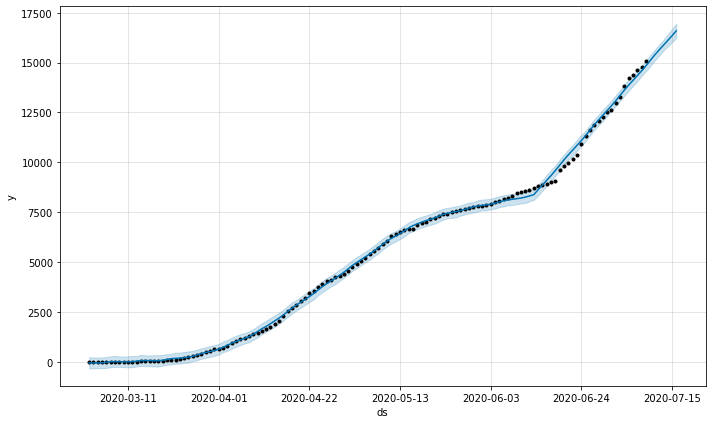

In [188]:
recovered_forecast_plot = m.plot(forecast)

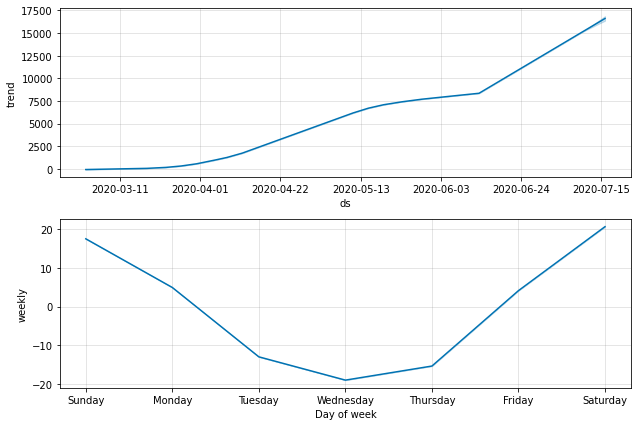

In [189]:
recovered_forecast_plot = m.plot_components(forecast)

# R0 after forcasting 

In [77]:
#beta le taux d'infection par chaque jour  , gamma le taux de guerir
N=40000000
S0=1
T=0
#la date 
R0_date= forecast['ds'].copy()
R0_moroco['Confirmed']=forecast['yhat'].copy()


#beta/gamma
liste_R0=[]
liste_R0_w=[]
liste_R0_m=[]
drapo=1

#R0/day
for i in range(len(R0_moroco['Confirmed'])):
    if(drapo==1):
        liste_R0.append(1.0)
        drapo=0
    else:
        if(R0_moroco['Confirmed'][i-1]!=0 and R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1]>0.1):
            liste_R0.append(R0_moroco['Confirmed'][i]/R0_moroco['Confirmed'][i-1])
        else:
            liste_R0.append(R0_moroco['Confirmed'][i]/1)
        T=T+R0_moroco['Confirmed'][i]


#plot R0
# import plotly.graph_objects as go
# Rise of COVID-19 cases in India
fig = go.Figure()
fig.add_trace(go.Scatter(x=R0_date, y = liste_R0, mode='lines+markers',name='R0 by day  '))

#fig.add_trace(go.Scatter(x=R0_date_w, y = liste_R0_m, mode='lines+markers',name='R0 by month'))
fig.update_layout(title_text='R0',plot_bgcolor='rgb(230, 230, 230)')
#fig.show()

In [78]:
ML_data_maroc= pd.DataFrame(columns=['Date','Confirmed'], data=data_maroc[['Date','Confirmed']].values)
## Replace Missing Data
ML_data_maroc.fillna(method='ffill', inplace=True)
ML_data_maroc.fillna(value=0, inplace=True)

ML_data_maroc.tail(10)

,Date,Confirmed
120,30/06/2020,12533.0
121,01/07/2020,12636.0
122,02/07/2020,12969.0
123,03/07/2020,13288.0
124,04/07/2020,13822.0
125,05/07/2020,14215.0
126,06/07/2020,14379.0
127,07/07/2020,14607.0
128,08/07/2020,14771.0
129,09/07/2020,15079.0


In [79]:
ML_data_maroc.columns = ['ds','y']

In [80]:
ML_data_maroc

,ds,y
0,02/03/2020,1.0
1,03/03/2020,1.0
2,04/03/2020,2.0
3,05/03/2020,2.0
4,06/03/2020,2.0
...,...,...
125,05/07/2020,14215.0
126,06/07/2020,14379.0
127,07/07/2020,14607.0
128,08/07/2020,14771.0


In [81]:
m = Prophet(interval_width=0.95)
m.fit(ML_data_maroc)
future = m.make_future_dataframe(periods=7)
future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
132,2020-12-09
133,2020-12-10
134,2020-12-11
135,2020-12-12
136,2020-12-13


In [82]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
132,2020-12-09,7187.967966,-669.702959,14926.939895
133,2020-12-10,7763.276631,153.417607,15332.593900
134,2020-12-11,7904.514027,-314.690325,15797.106430
135,2020-12-12,7651.476767,712.326091,15072.439232
136,2020-12-13,8279.985954,821.951678,16444.987159


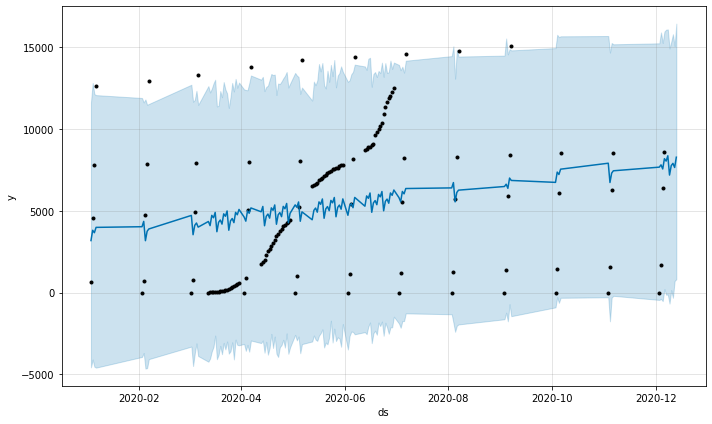

In [83]:
recovered_forecast_plot = m.plot(forecast)

we may be reaching by the statistic the above of 2000 cases in the end of this week

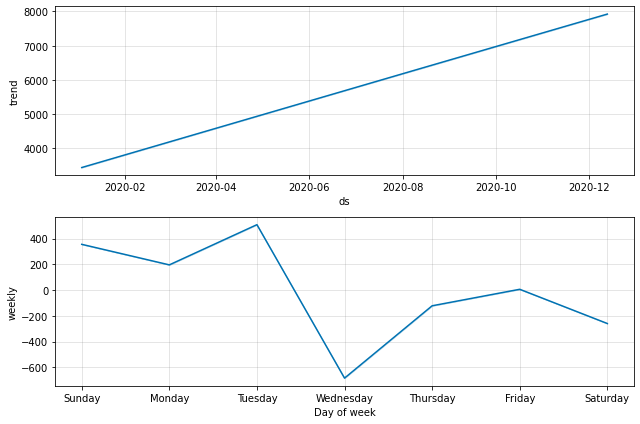

In [84]:
recovered_forecast_plot = m.plot_components(forecast)

# methode2

We fit the model by instantiating a new Prophet object. Any settings to the forecasting procedure are passed into the constructor. Then you call its fit method and pass in the historical dataframe. Fitting should take 1-5 seconds.

In [85]:
m = Prophet()
m.fit(ML_data_maroc)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predictions are then made on a dataframe with a column ds containing the dates for which a prediction is to be made. You can get a suitable dataframe that extends into the future a specified number of days using the helper method Prophet.make_future_dataframe. By default it will also include the dates from the history, so we will see the model fit as well.

In [86]:
future = m.make_future_dataframe(periods=7)
future.tail()

,ds
132,2020-12-09
133,2020-12-10
134,2020-12-11
135,2020-12-12
136,2020-12-13


The predict method will assign each row in future a predicted value which it names yhat. If you pass in historical dates, it will provide an in-sample fit. The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.

In [87]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
132,2020-12-09,7187.967966,1860.164216,12502.689805
133,2020-12-10,7763.276631,2372.196823,13074.028869
134,2020-12-11,7904.514027,2562.198422,12997.301638
135,2020-12-12,7651.476767,2561.903681,12999.479033
136,2020-12-13,8279.985954,2796.741829,13177.611657


You can plot the forecast by calling the Prophet.plot method and passing in your forecast dataframe.

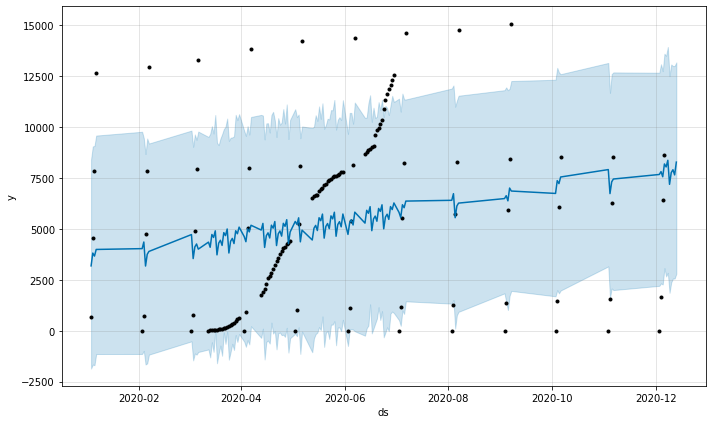

In [88]:
# Python
fig1 = m.plot(forecast)

If you want to see the forecast components, you can use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

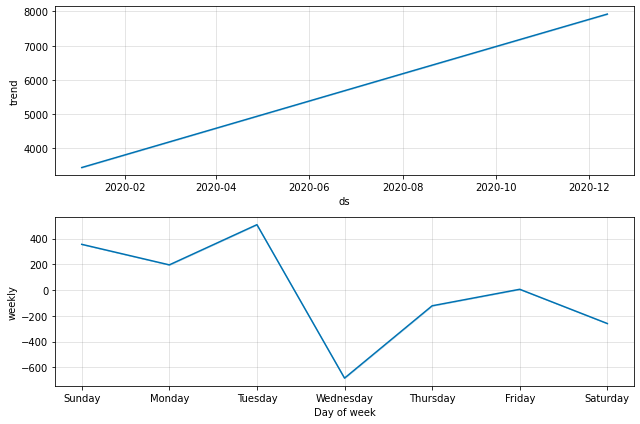

In [89]:
# Python
fig2 = m.plot_components(forecast)


# Will Morroco become the next Italy/ S.Korea/ Wuhan?
Yes, if you look at the world's data and its forecast you can say that Morroco might face one of its worst days if we are not taking strict measures against COVID-19.

In [90]:
# Python
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)

In [91]:
#le role de confinement 70%
#beta le taux d'infection par chaque jour  , gamma le taux de guerir
N=40000000
S0=1
T=0
#la date 
R0_date= R0_moroco['Date'].copy()
#beta/gamma
liste_beta=[]
liste_gamma=[]
liste_sigma=[]
liste_R0=[]
for i,j,k in zip(R0_moroco['Confirmed'], R0_moroco['Recovered'],R0_moroco['Deaths']):
    liste_beta.append(i/S0)
    T=T+i
    liste_gamma.append(j/T)
    liste_sigma.append(k/T)

S0=(N-1)*0.7
#calcule R0 
for i,j,K in zip(liste_beta,liste_gamma,liste_sigma):
    if(j != 0):
        liste_R0.append((i*S0)/j)
    else:
        liste_R0.append(0)
    S0=S0-i
#plot R0
# import plotly.graph_objects as go
# Rise of COVID-19 cases in India
fig = go.Figure()
fig.add_trace(go.Scatter(x=R0_date, y = liste_R0, mode='lines+markers',name='Total Cases'))
fig.update_layout(title_text='erroné_R0',plot_bgcolor='rgb(230, 230, 230)')
fig.show()

# COVID-19/ABS

Nous vivons des temps inhabituels, où l’humanité est sous l’attaque d’une créature microscopique qui menace notre santé (physique et mentale), l’économie, les biens sociaux, etc.Le nombre de variables impliquées et la complexité de leurs relations font paniquer les gens pour comprendre les implications de ses actions locales dans les futurs scénarios globaux, de court à moyen terme.

mais la questions qui se pose ici comment pourrions-nous prévoir ces scénarios futurs? Comment le gouvernement sait-il quels seront les effets positifs de telles mesures de protection?


il y a beaucoup de réponses possibles à cette question.Premièrement, nous devons définir qu’une société qui vit sur un territoire est un système complexe et dynamique.De tels sort ce types de systèmes ont de nombreuses variables en interaction, présentent un comportement non linéaire et ses propriétés évoluent avec le temps. Son comportement est généralement stochastique, il peut dépendre aussi de ses conditions initiales, il peut être affecté par les sociétés voisines (avec des politiques et des dynamiques différentes).

ABS(agent-based model)
---------------
un bon choix pour simuler ces systèmes complexes dynamiques en raison de sa simplicité de mise en œuvre et des résultats précis par rapport aux données réelles des événements.Et aussi parce que nous pouvons concevoir des scénarios en effectuant des interventions sur les variables environnementales de simulation et en mesurer les effets.

Nous allons maintenant supposer des événements discrets pour notre simulation, ce qui signifie que le temps et les composants du système sont discrets et atomiques. Plus précisément, la simulation basée-agents (ABS) est composée d’une population d’agents, dans une boucle où les agents s’exécutent et interagissent. Chaque agent est considéré comme autonome, en ce sens qu’il a son état interne, mais la population des agents partage un environnement commun. Les variables d’état déterminent le comportement de chaque agent et doivent représenter les caractéristiques du problème.

L’ABS est utilisé dans la simulation de systèmes dynamiques complexes utilisant les états individuels de ses composants pour détecter les comportements globaux qui émergent en raison des interactions entre les agents sur les itérations. Ensuite, son objectif principal est de simuler l’évolution temporelle du système, en stockant des statistiques dérivées des états internes des agents dans chaque itération. L’ABS nous permet de simuler des systèmes avec des relations variables non linéaires complexes, des conditions complexes et des restrictions qui peuvent être difficiles à décrire mathématiquement.
(source = https://en.wikipedia.org/wiki/Agent-based_model)

le but
------
Nous utiliserons un ABS pour simuler un système dont la dynamique est déjà connue, représenté par le modèle SIR et ses variantes.
(source = https://mesa.readthedocs.io/en/master/tutorials/intro_tutorial.html)

simulation d’épidémie
-----------

Tout d’abord, décidons ce que nous voulons simuler.La propagation contagieuse causée par la circulation et les effets économiques de l’isolement social sont nos principaux objectifs.

Population Demography
----------
Premièrement, nous devons générer des agents ayant les mêmes caractéristiques que la population d’un pays(dans notre cas c'est le MAROC). (source = https://www.indexmundi.com/morocco/age_structure.html && https://www.indexmundi.com/morocco/demographics_profile.html)

Propagation contagieuse
----------------------
COVID-19 est une maladie hautement contagieuse et, selon le Rapport(source = https://www.imperial.ac.uk/media/imperial-college/medicine/mrc-gida/2020-01-25-COVID19-Report-3.pdf), « en moyenne, chaque cas a été infecté 2,6 (intervalle d’incertitude : 1,5-3,5 [R0]).

Selon le modèle SIR, chaque agent doit se trouver dans l’une des situations suivantes : sensible, infecté et récupéré (qui est également utilisé pour les personnes immunisées). Chaque simulation a un pourcentage initial de personnes infectées et immunisées, et le reste de la population est composée d’individus sensibles.


In [92]:
#pip install --upgrade pip

In [93]:
#conda install git

In [94]:
#pip install gitpython

In [95]:
import git 

In [96]:
!pip3 install git+https://github.com/petroniocandido/COVID19_AgentBasedSimulation.git

  Cloning https://github.com/petroniocandido/COVID19_AgentBasedSimulation.git to c:\users\benla\appdata\local\temp\pip-req-build-36p01f75
  Created wheel for covid-abs: filename=covid_abs-0.0.2-py3-none-any.whl size=31728 sha256=ff7a86342a0f181006a35df1f987d66049cf86ba74d1d83346f06e472201a30c
  Stored in directory: C:\Users\benla\AppData\Local\Temp\pip-ephem-wheel-cache-knp9ylx1\wheels\79\f0\cf\e8c988728f98d8e80e3817fab172b95e8b5af9cf2d9a26ce7a
Successfully built covid-abs


  Running command git clone -q https://github.com/petroniocandido/COVID19_AgentBasedSimulation.git 'C:\Users\benla\AppData\Local\Temp\pip-req-build-36p01f75'


In [97]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import animation, rc
from IPython.display import HTML

warnings.simplefilter('ignore')

In [98]:
  import pandas.util.testing as tm

In [99]:
from covid_abs.abs import *
from covid_abs.graphics import *

In [100]:
conda install -c conda-forge ffmpeg

Solving environment: ...working... done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


# Scenario 1 - Do Nothing

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1440x360 -pix_fmt rgba -r 4.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\benla\AppData\Local\Temp\tmpg4h933pw\temp.m4v'


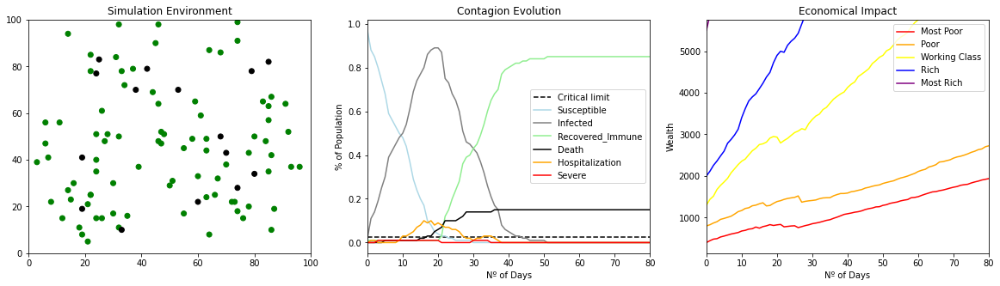

In [101]:

sim = Simulation(
    # Pourcentage de personnes infectées dans la population = 0,0222125‬ (dernier miseajour c'est "16/6")
    initial_infected_perc = 0.0222125,
    # Pourcentage du système immunitaire dans la population = 0,01957‬
    initial_immune_perc = 0.01957,
    # Longueur de l’environnement de simulation     
    length=100,                       
    # Hauteur de l’environnement de simulation
    height=100,
    # la taille de population
    population_size=100,
    # La distance minimale entre les agents de contagion  5.
    contagion_distance=5.,                
    #Pourcentage maximal de la population que le système de santé peut traiter simultanément 0 027
    critical_limit=0.027,
    # plages de mobilité des agents, par statut
    amplitudes = {                        
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 5 
        }
)

anim = execute_simulation(sim, iterations=80)

#rc('animation', html='jshtml')
rc('animation', html='html5')
anim

#save_gif(anim, 'do_nothing.gif')

In [102]:
from covid_abs.experiments import batch_experiment

batch_experiment(20, 80, "scenario1.csv",
    # Pourcentage de personnes infectées dans la population = 0,0222125‬ (dernier miseajour c'est "16/6")
                 initial_infected_perc=0.0222125,
    # Pourcentage du système immunitaire dans la population = 0,01957‬
                 initial_immune_perc=0.01957,
    # Longueur de l’environnement de simulation     
                 length=100,
    # Hauteur de l’environnement de simulation
                 height=100,
    # la taille de population
                 population_size=100,
    # La distance minimale entre les agents de contagion  5.
                 contagion_distance=5.,
    #Pourcentage maximal de la population que le système de santé peut traiter simultanément 0 027
                 critical_limit=0.027,
    # plages de mobilité des agents, par statut
                 amplitudes={
                     Status.Susceptible: 5,
                     Status.Recovered_Immune: 5,
                     Status.Infected: 5
                 }
                 )

[[0, 'Susceptible', 0.9, 0.9460000000000001, 0.020591260281973972, 0.97], [0, 'Infected', 0.02, 0.044000000000000004, 0.020591260281974, 0.09], [0, 'Recovered_Immune', 0.01, 0.010000000000000002, 1.734723475976807e-18, 0.01], [0, 'Death', 0.0, 0.0, 0.0, 0.0], [0, 'Asymptomatic', 0.99, 0.9995, 0.0021794494717703385, 1.0], [0, 'Hospitalization', 0.0, 0.0005, 0.002179449471770337, 0.01], [0, 'Severe', 0.0, 0.0, 0.0, 0.0], [0, 'Q1', 412.5023249479484, 428.8135935383083, 11.241733517670358, 449.81100999931067], [0, 'Q2', 804.2799300541158, 849.7945326933695, 25.43595085233773, 917.7245216258507], [0, 'Q3', 1311.483752967265, 1395.6592063068688, 48.66877087006776, 1491.6454805132903], [0, 'Q4', 2011.2462784881993, 2137.1296459712867, 67.28739240696918, 2300.797950595158], [0, 'Q5', 5620.4080238636525, 5850.462533976746, 160.02964188219616, 6382.098218919562], [1, 'Susceptible', 0.84, 0.9215, 0.033507461855533, 0.97], [1, 'Infected', 0.02, 0.0685, 0.033507461855533015, 0.15], [1, 'Recovered_I

,Iteration,Metric,Min,Avg,Std,Max
0,0,Susceptible,0.900000,0.946000,2.059126e-02,0.970000
1,0,Infected,0.020000,0.044000,2.059126e-02,0.090000
2,0,Recovered_Immune,0.010000,0.010000,1.734723e-18,0.010000
3,0,Death,0.000000,0.000000,0.000000e+00,0.000000
4,0,Asymptomatic,0.990000,0.999500,2.179449e-03,1.000000
...,...,...,...,...,...,...
955,79,Q1,1310.477737,2159.949564,6.528694e+02,3386.677264
956,79,Q2,1687.759385,3744.460115,1.138074e+03,6670.464204
957,79,Q3,4393.177568,7184.542400,1.798941e+03,11124.032173
958,79,Q4,4859.755632,9995.685568,2.399629e+03,14309.387639


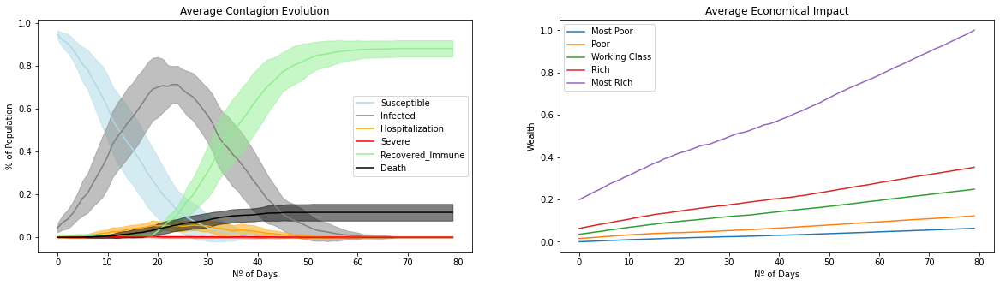

In [103]:
from covid_abs.experiments import plot_batch_results

df = pd.read_csv('scenario1.csv')

plot_batch_results(df)

# Scénario 2 - Limiter la mobilité uniquement pour les personnes infectées

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1440x360 -pix_fmt rgba -r 4.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\benla\AppData\Local\Temp\tmpww14iexg\temp.m4v'


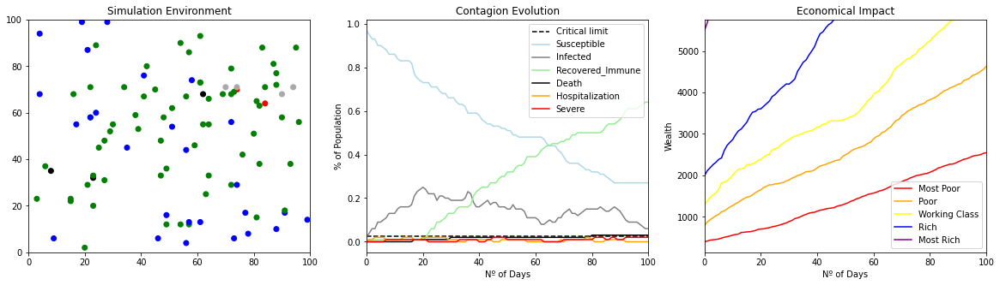

In [104]:
from covid_abs.abs import *
from covid_abs.graphics import *

sim = Simulation(
    # Pourcentage de personnes infectées dans la population = 0,0222125‬ (dernier miseajour c'est "16/6")
    initial_infected_perc = 0.0222125,
    # Pourcentage du système immunitaire dans la population = 0,01957‬
    initial_immune_perc = 0.01957,
    # Longueur de l’environnement de simulation     
    length=100,                       
    # Hauteur de l’environnement de simulation
    height=100,
    # la taille de population
    population_size=100,
    # La distance minimale entre les agents de contagion  5.
    contagion_distance=5.,                
    #Pourcentage maximal de la population que le système de santé peut traiter simultanément 0 027
    critical_limit=0.027,
    # plages de mobilité des agents, par statut
    amplitudes = {                        
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 0
        }
)

anim = execute_simulation(sim, iterations=100)

#rc('animation', html='jshtml')
rc('animation', html='html5')
anim

#save_gif(anim, 'do_nothing.gif')

In [105]:
from covid_abs.experiments import batch_experiment

batch_experiment(50, 80, "scenario2.csv",
    # Pourcentage de personnes infectées dans la population = 0,0222125‬ (dernier miseajour c'est "16/6")
                 initial_infected_perc=0.02,
    # Pourcentage du système immunitaire dans la population = 0,01957‬
                 initial_immune_perc=0.01,
    # Longueur de l’environnement de simulation     
                 length=100,
    # Hauteur de l’environnement de simulation
                 height=100,
    # la taille de population
                 population_size=100,
    # La distance minimale entre les agents de contagion  5.
                 contagion_distance=5.,
    #Pourcentage maximal de la population que le système de santé peut traiter simultanément 0 027
                 critical_limit=0.027,
    # plages de mobilité des agents, par statut
                 amplitudes={
                     Status.Susceptible: 5,
                     Status.Recovered_Immune: 5,
                     Status.Infected: 0
                 }
                 )



[[0, 'Susceptible', 0.92, 0.9528, 0.014427751037497133, 0.97], [0, 'Infected', 0.02, 0.037200000000000004, 0.01442775103749715, 0.07], [0, 'Recovered_Immune', 0.01, 0.01, 0.0, 0.01], [0, 'Death', 0.0, 0.0, 0.0, 0.0], [0, 'Asymptomatic', 0.99, 0.9992, 0.00271293199325011, 1.0], [0, 'Hospitalization', 0.0, 0.0008, 0.002712931993250107, 0.01], [0, 'Severe', 0.0, 0.0, 0.0, 0.0], [0, 'Q1', 408.3654703609919, 426.22894050950003, 10.36016663552923, 447.23872837257977], [0, 'Q2', 796.4995401202217, 849.5460807909626, 24.471284924737247, 916.8014635749594], [0, 'Q3', 1315.9563463701454, 1380.0334142738627, 40.78055732829446, 1509.732208028328], [0, 'Q4', 2033.7865465871137, 2125.0204828923092, 45.29393605239602, 2226.443380673003], [0, 'Q5', 5574.283677301126, 5843.039580444874, 127.91690623035663, 6116.974964324652], [1, 'Susceptible', 0.87, 0.9418000000000001, 0.024713559031430483, 0.97], [1, 'Infected', 0.02, 0.0482, 0.0247135590314305, 0.12], [1, 'Recovered_Immune', 0.01, 0.01, 0.0, 0.01], 

,Iteration,Metric,Min,Avg,Std,Max
0,0,Susceptible,0.920000,0.952800,0.014428,0.970000
1,0,Infected,0.020000,0.037200,0.014428,0.070000
2,0,Recovered_Immune,0.010000,0.010000,0.000000,0.010000
3,0,Death,0.000000,0.000000,0.000000,0.000000
4,0,Asymptomatic,0.990000,0.999200,0.002713,1.000000
...,...,...,...,...,...,...
955,79,Q1,999.398272,1987.075407,449.863545,3024.617519
956,79,Q2,2416.312572,3989.833902,918.178582,6021.456238
957,79,Q3,2967.804392,6375.950098,1536.043114,9579.773966
958,79,Q4,5591.107431,9568.223147,2095.068000,14984.351266


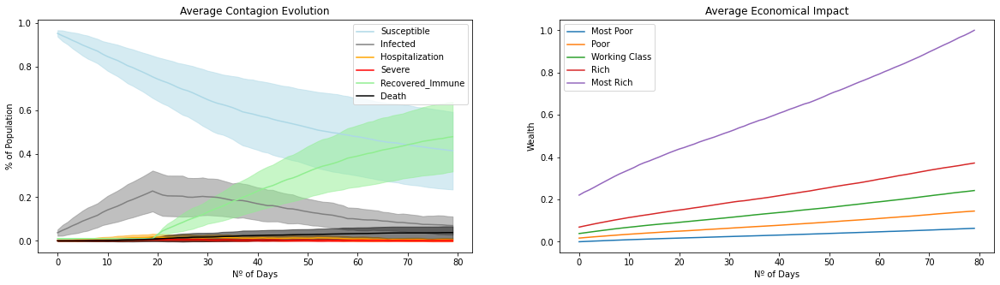

In [106]:
from covid_abs.experiments import plot_batch_results

df = pd.read_csv('scenario2.csv')

plot_batch_results(df)

# Scénario 3 - Confinement total (limiter la mobilité de tout le monde)

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1440x360 -pix_fmt rgba -r 4.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\benla\AppData\Local\Temp\tmpztkw5pfb\temp.m4v'


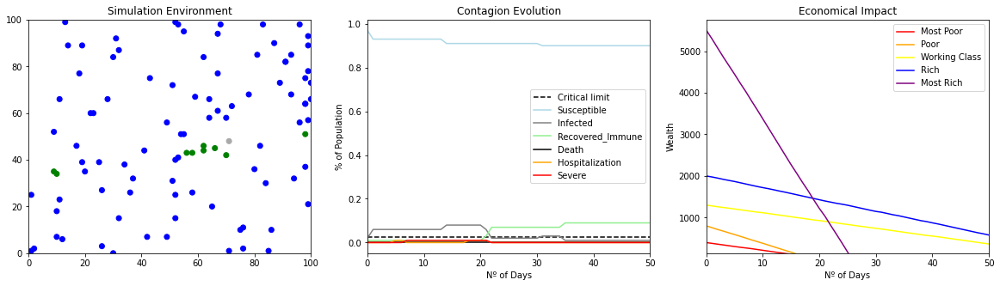

In [107]:
from covid_abs.abs import *
from covid_abs.graphics import *

sim = Simulation(
    # Pourcentage de personnes infectées dans la population = 0,0222125‬ (dernier miseajour c'est "16/6")
    initial_infected_perc = 0.0222125,
    # Pourcentage du système immunitaire dans la population = 0,01957‬
    initial_immune_perc = 0.01957,
    # Longueur de l’environnement de simulation     
    length=100,                       
    # Hauteur de l’environnement de simulation
    height=100,
    # la taille de population
    population_size=100,
    # La distance minimale entre les agents de contagion  5.
    contagion_distance=5.,                
    #Pourcentage maximal de la population que le système de santé peut traiter simultanément 0 027
    critical_limit=0.027,
    # plages de mobilité des agents, par statut
    amplitudes = {                        
        Status.Susceptible : 0.5, 
        Status.Recovered_Immune : 0.5, 
        Status.Infected : 0
        }
)

anim = execute_simulation(sim, iterations=50)

#rc('animation', html='jshtml')
rc('animation', html='html5')
anim

#save_gif(anim, 'do_nothing.gif')

In [108]:
from covid_abs.experiments import batch_experiment

batch_experiment(50, 80, "scenario3.csv",

                 initial_infected_perc=0.0222125,

                 initial_immune_perc=0.01957,

                 length=100,

                 height=100,

                 population_size=100,

                 contagion_distance=5.,
                 critical_limit=0.027,
                 amplitudes={
                     Status.Susceptible: 0.5,
                     Status.Recovered_Immune: 0.5,
                     Status.Infected: 0
                 }
                 )

[[0, 'Susceptible', 0.91, 0.9512, 0.017278888853164122, 0.97], [0, 'Infected', 0.02, 0.0388, 0.017278888853164143, 0.08], [0, 'Recovered_Immune', 0.01, 0.01, 0.0, 0.01], [0, 'Death', 0.0, 0.0, 0.0, 0.0], [0, 'Asymptomatic', 0.99, 0.9998, 0.0014000000000000013, 1.0], [0, 'Hospitalization', 0.0, 0.0002, 0.0014000000000000002, 0.01], [0, 'Severe', 0.0, 0.0, 0.0, 0.0], [0, 'Q1', 378.35742566102147, 386.0160617359052, 3.539013020348827, 392.1250504205477], [0, 'Q2', 754.3226986090845, 772.9058606901772, 6.883894051220668, 786.0000000000001], [0, 'Q3', 1231.6755547605526, 1256.139247821022, 10.401568826016561, 1270.75], [0, 'Q4', 1892.6647403751722, 1933.6529727150066, 17.259195355482497, 1974.1315402901266], [0, 'Q5', 5143.131113426121, 5316.437322910064, 49.55895930940547, 5417.5], [1, 'Susceptible', 0.9, 0.9482, 0.01996897593768892, 0.97], [1, 'Infected', 0.02, 0.0418, 0.01996897593768894, 0.09], [1, 'Recovered_Immune', 0.01, 0.01, 0.0, 0.01], [1, 'Death', 0.0, 0.0, 0.0, 0.0], [1, 'Asympt

,Iteration,Metric,Min,Avg,Std,Max
0,0,Susceptible,0.910000,0.951200,0.017279,0.970000
1,0,Infected,0.020000,0.038800,0.017279,0.080000
2,0,Recovered_Immune,0.010000,0.010000,0.000000,0.010000
3,0,Death,0.000000,0.000000,0.000000,0.000000
4,0,Asymptomatic,0.990000,0.999800,0.001400,1.000000
...,...,...,...,...,...,...
955,79,Q1,-1355.033095,-722.796397,277.358333,-211.656621
956,79,Q2,-2883.913505,-1389.917056,533.732991,-284.933900
957,79,Q3,-4172.998991,-2170.155331,795.267018,-946.772547
958,79,Q4,-6809.761629,-3236.460332,1375.417956,-286.519123


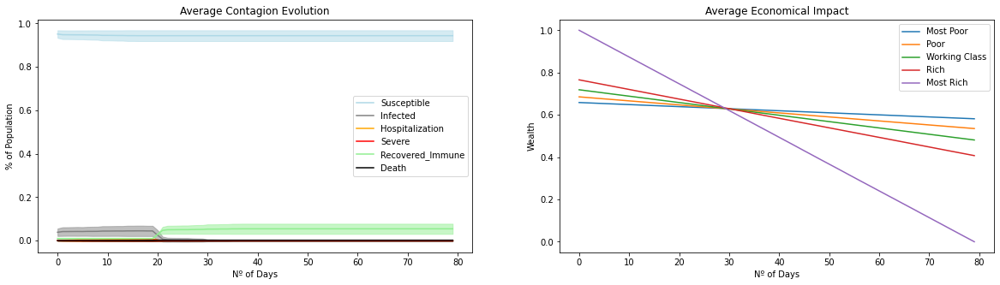

In [109]:
from covid_abs.experiments import plot_batch_results

df = pd.read_csv('scenario3.csv')

plot_batch_results(df)

# Scénario 4 - Limiter la mobilité après que 10 % de la population a été infectée et libérer les restrictions lorsque plus de 95 % est sécuritaire

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1440x360 -pix_fmt rgba -r 4.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\benla\AppData\Local\Temp\tmp5zfm7l82\temp.m4v'


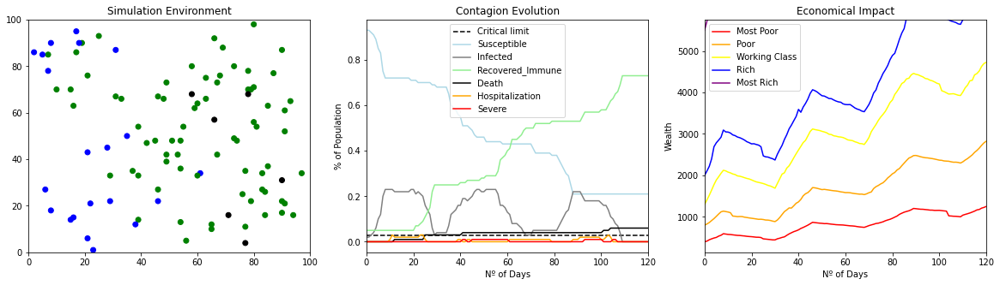

In [110]:
sim = Simulation(
    length=100,                          
    height=100,
    initial_infected_perc = 0.0222125,       
    population_size=100,                     
    contagion_distance=5,                
    critical_limit=.027,
    amplitudes = {                       
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 5 
        })

sim.append_trigger_simulation(lambda a : a.get_statistics()['Infected'] >= .2, 
                             'amplitudes', lambda a : {                       
        Status.Susceptible : 1.5, 
        Status.Recovered_Immune : 1.5, 
        Status.Infected : 1.5 
        } )

sim.append_trigger_simulation(lambda a : a.get_statistics()['Infected'] <= .05, 
                             'amplitudes', lambda a : {                       
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 5 
        } )


anim = execute_simulation(sim, iterations=120)

#rc('animation', html='jshtml')
rc('animation', html='html5')
anim


In [111]:
from covid_abs.experiments import batch_experiment

batch_experiment(50, 120, "scenario4.csv",
                 length=100,
                 height=100,
                 initial_infected_perc=0.0222125,
                 population_size=100,
                 contagion_distance=5,
                 critical_limit=.027,
                 amplitudes={
                     Status.Susceptible: 5,
                     Status.Recovered_Immune: 5,
                     Status.Infected: 5
                 },
                 triggers_simulation=[
                     {'condition': lambda a: a.get_statistics()['Infected'] >= .2,
                      'attribute': 'amplitudes',
                      'action': lambda a: {
                          Status.Susceptible: 1.5,
                          Status.Recovered_Immune: 1.5,
                          Status.Infected: 1.5
                      }},
                     {'condition': lambda a: a.get_statistics()['Infected'] <= .05,
                      'attribute': 'amplitudes',
                      'action': lambda a: {
                          Status.Susceptible: 5,
                          Status.Recovered_Immune: 5,
                          Status.Infected: 5
                      }}
                 ])


[[0, 'Susceptible', 0.87, 0.9142, 0.0140128512444827, 0.93], [0, 'Infected', 0.02, 0.0358, 0.014012851244482687, 0.08], [0, 'Recovered_Immune', 0.05, 0.04999999999999999, 1.3877787807814457e-17, 0.05], [0, 'Death', 0.0, 0.0, 0.0, 0.0], [0, 'Asymptomatic', 0.99, 0.9994, 0.0023748684174075855, 1.0], [0, 'Hospitalization', 0.0, 0.0006, 0.0023748684174075834, 0.01], [0, 'Severe', 0.0, 0.0, 0.0, 0.0], [0, 'Q1', 408.02646301584315, 427.5195965648433, 9.958734298794301, 452.008327023387], [0, 'Q2', 800.7416293986006, 848.7368275211572, 23.503721130516066, 900.7824984416168], [0, 'Q3', 1311.3542990344981, 1377.5357964594646, 37.64390805283958, 1469.4132928865124], [0, 'Q4', 2016.731423410834, 2128.6304904861677, 59.035925203253555, 2281.1240258602675], [0, 'Q5', 5541.334966250844, 5820.754922750594, 153.99660300141088, 6233.826748462964], [1, 'Susceptible', 0.83, 0.8982000000000001, 0.025431476559570843, 0.93], [1, 'Infected', 0.02, 0.0518, 0.025431476559570818, 0.12], [1, 'Recovered_Immune', 

,Iteration,Metric,Min,Avg,Std,Max
0,0,Susceptible,0.870000,0.914200,1.401285e-02,0.930000
1,0,Infected,0.020000,0.035800,1.401285e-02,0.080000
2,0,Recovered_Immune,0.050000,0.050000,1.387779e-17,0.050000
3,0,Death,0.000000,0.000000,0.000000e+00,0.000000
4,0,Asymptomatic,0.990000,0.999400,2.374868e-03,1.000000
...,...,...,...,...,...,...
1435,119,Q1,831.939352,1819.525246,5.853186e+02,3281.663300
1436,119,Q2,1450.491728,3386.175024,1.094175e+03,6238.055745
1437,119,Q3,2170.440064,5484.562412,1.768550e+03,10872.274213
1438,119,Q4,3848.078763,9212.531327,3.274717e+03,20138.883075


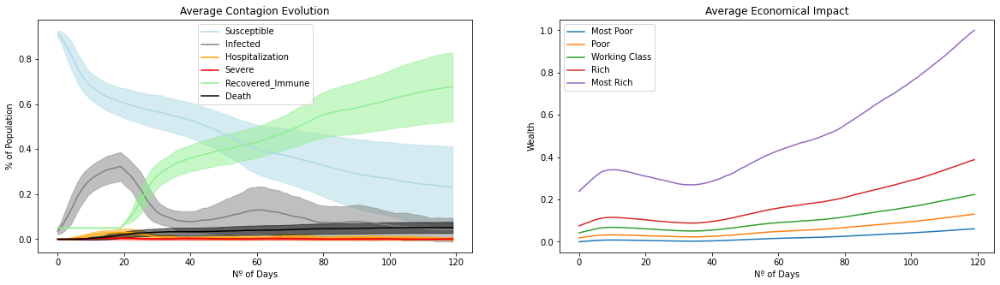

In [112]:
from covid_abs.experiments import plot_batch_results

df = pd.read_csv('scenario4.csv')

plot_batch_results(df)

# Scénario 5 - Populations contrôlées en contact avec des populations non contrôlées

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1440x360 -pix_fmt rgba -r 4.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\benla\AppData\Local\Temp\tmpieifhjss\temp.m4v'


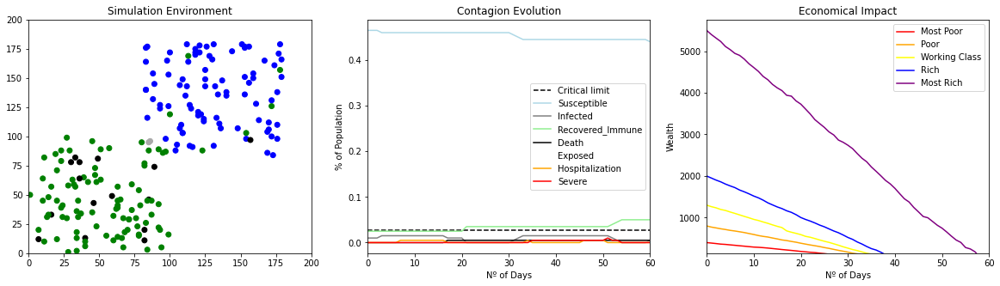

In [113]:
sim = MultiPopulationSimulation(
    length=200,                          
    height=200,
    contagion_distance=5.,
    critical_limit=.027,)

sim.append(Simulation(initial_infected_perc = 0.0222125,       
                     length=100,                          
                     height=100,                      
                     population_size=100,                     
                     contagion_distance=5.,                
                     critical_limit=.027,
    amplitudes = {                        
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 5 
        }), (0,0))
sim.append(Simulation(initial_infected_perc = 0.02,       
    length=100,
    height=100,             
    population_size=100,            
    contagion_distance=5.,       
    critical_limit=.027,
    amplitudes = {               
        Status.Susceptible : 1, 
        Status.Recovered_Immune : 1, 
        Status.Infected : 1 
        }),(80,80))

anim = execute_simulation(sim, iterations=60)

#rc('animation', html='jshtml')
rc('animation', html='html5')
anim

In [114]:
from covid_abs.experiments import batch_experiment

sim1 = Simulation(initial_infected_perc=0.0222125,
                  length=100,
                  height=100,
                  population_size=100,
                  contagion_distance=5.,
                  critical_limit=.027,
                  amplitudes={
                      Status.Susceptible: 5,
                      Status.Recovered_Immune: 5,
                      Status.Infected: 5
                  })

sim2 = Simulation(initial_infected_perc=0.0222125,
                  length=100,
                  height=100,
                  population_size=100,
                  contagion_distance=5.,
                  critical_limit=.027,
                  amplitudes={
                      Status.Susceptible: 1,
                      Status.Recovered_Immune: 1,
                      Status.Infected: 1
                  })

batch_experiment(50, 80, "scenario5.csv", simulation_type=MultiPopulationSimulation,
                 length=200,
                 height=200,
                 contagion_distance=5.,
                 critical_limit=.027,
                 simulations=[sim1, sim2],
                 positions=[(0, 0), (80, 80)],
                 total_population=160
                 )

KeyboardInterrupt: 

In [ ]:
from covid_abs.experiments import plot_batch_results

df = pd.read_csv('scenario5.csv')

plot_batch_results(df)

# Scénario 6 - Isolement vertical

In [ ]:
from covid_abs.abs import *
from covid_abs.graphics import *

sim = Simulation(
    length=100,                          
    height=100,
    initial_infected_perc = 0.0222125,       
    population_size=100,                     
    contagion_distance=5,                
    critical_limit=.027,
    amplitudes = {                       
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 5 
        })

sim.append_trigger_population(lambda a : a.age >= 60, 
                             'move', lambda a : (a.x, a.y) )


anim = execute_simulation(sim, iterations=120)

#rc('animation', html='jshtml')
rc('animation', html='html5')
anim


# Scénario 7 - Masques pour tous

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1440x360 -pix_fmt rgba -r 4.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\benla\AppData\Local\Temp\tmpddgj6xfs\temp.m4v'


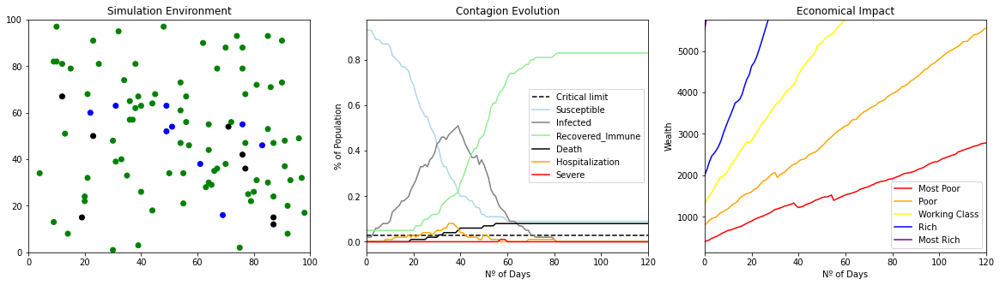

In [190]:
from covid_abs.abs import *
from covid_abs.graphics import *

sim = Simulation(
    length=100,                          
    height=100,
    initial_infected_perc = 0.0222125,       
    population_size=100,                     
    contagion_distance=3,                
    critical_limit=.027,
    contagion_rate = .65, 
    amplitudes = {                       
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 5 
        })

anim = execute_simulation(sim, iterations=120)

#rc('animation', html='jshtml')
rc('animation', html='html5')
anim


In [ ]:
from covid_abs.experiments import batch_experiment

batch_experiment(50, 80, "scenario7.csv",
                 length=100,                          
    height=100,
    initial_infected_perc = 0.0222125,       
    population_size=100,                     
    contagion_distance=3,                
    critical_limit=.027,
    contagion_rate = .65, 
    amplitudes = {                       
        Status.Susceptible : 5, 
        Status.Recovered_Immune : 5, 
        Status.Infected : 5 
        })

In [ ]:
from covid_abs.experiments import plot_batch_results

df = pd.read_csv('scenario7.csv')

plot_batch_results(df)

In [ ]:
import folium 
import webbrowser
import datetime

def MapTweetLocations(DATE):

    # Select Row
    row = data[m_data.Date == DATE]
    row = row[REGIONS].iloc[row.shape[0]-1,:]
    
    # Make Data as Dataframe
    df = {
        'latitude': [32.320296, 33.590000, 31.932124, 23.692847, 34.037120, 28.986355, 27.158507, 31.630000, 34.680000, 34.020000, 30.421440, 35.783621],
        'longitude': [-6.380926, -7.610000, -4.424149, -15.938255, -5.002964, -10.057375, -13.207878, -8.000000, -1.910000, -6.830000, -9.583039, -5.809643],
        'Region': row.index.to_list(),
        'Ncases': list(row.values)
    }
    df = pd.DataFrame.from_dict(df)

    # Create Map
    fig = folium.Figure(width=800, height=500)
    latitude, longitude = 29.852972, -12.763558
    CovidMap = folium.Map(location=[latitude, longitude], zoom_start=5)
    
    # Add Title
    title_html = f' <h3 align="center" style="font-size:20px"><b>Map of Covid-19 Cases in Morocco Regions By {DATE}</b></h3>'
    CovidMap.get_root().html.add_child(folium.Element(title_html))
    
    for lat, lon, Region, Ncases in zip(df['latitude'], df['longitude'], df['Region'], df['Ncases']):
        folium.CircleMarker(
            [lat, lon],
            radius=.1 * Ncases//50,
            popup = ('Region: ' + str(Region).capitalize() + '<br>'
                     'Cases: ' + str(Ncases) + '<br>'),
            color='red',
            fill_color = "red",
            fill=True,
            fill_opacity=0.7
            ).add_to(CovidMap)
        
    fig.add_child(CovidMap)
    return fig
    
DATE = DATE.today() - timedelta(days=15)
MapTweetLocations(DATE)

source
------
Prof. Dr. Petrônio Cândido de Lima e Silva
gmail ::petronio.candido@ifnmg.edu.br

